<a href="https://colab.research.google.com/github/cianadeveau/NeuroRNN/blob/main/RNN_seqmodel_extendedAnalyses.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
"""
Created on Tue May 24 13:58:28 2022
Modified by cdeveau on May 8 2024
@author: mbeiran
Requires PyTorch -> conda install pytorch::pytorch torchvision torchaudio -c pytorch
"""
# setup
%matplotlib inline
%reload_ext autoreload
%autoreload 2

# for system
import numpy as np
from scipy.special import softmax
import matplotlib.pyplot as plt
import torch
import seaborn as sns
import matplotlib
from pathlib import Path

from sklearn.decomposition import PCA
from scipy.spatial.distance import pdist, squareform
from scipy.stats import linregress
from scipy.signal import savgol_filter

import numpy as np
from mpl_toolkits.mplot3d import Axes3D
from scipy.signal import savgol_filter
import pandas as pd
# import ptitprince as pt

from scipy.stats import entropy, wasserstein_distance
from scipy.spatial.distance import jensenshannon
import itertools
from scipy.signal import chirp, find_peaks, peak_widths
import ipywidgets as widgets
from IPython.display import display

import torch.nn as nn
from sklearn.manifold import TSNE
import networkx as nx
from matplotlib import pyplot as plt
from mpl_toolkits import mplot3d
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

import glob
import os
from moviepy.editor import ImageSequenceClip
from matplotlib.colors import LinearSegmentedColormap


# import src files
# sys.path.append('../src/')
import sys
sys.path.insert(0,'/content/drive/My Drive/src')
import modules_simpleRNN as mm

  if event.key is 'enter':



In [ ]:
matplotlib.rc('pdf', fonttype=42)
# matplotlib.rc('font',**{'family':'serif','serif':['Arial']})
plt.rcParams['figure.dpi'] = 300
plt.rcParams['axes.labelsize'] = 7
plt.rcParams['xtick.labelsize'] = 7
plt.rcParams['ytick.labelsize'] = 7
plt.rcParams['legend.fontsize'] = 7
plt.rcParams['axes.titlesize'] = 7
!apt-get -qq install fonts-noto-cjk

import matplotlib.pyplot as plt
plt.rcParams['font.family'] = 'DejaVu Sans'

In [ ]:
datadir = Path('/content/drive/My Drive/Colab Notebooks/').expanduser()
figs_dir = datadir/'Figures'

In [ ]:
#%%
# =============================================================================
# Parameters
# =============================================================================
mm.set_plot()
N = 500 #number of neurons
hidden_size = N #same as number of neurons
Tau = 60 #membrane time constant (ms)
dta = 1 # integration timestep (ms)
alpha = dta/Tau #this ratio is an important parameter for pytorch

Tmax = 1000 #length of trial (ms)
ts = np.arange(0, Tmax, dta) #time axis
Nt = len(ts) #number of timepoints

trials = 100 #number of trials

s_Inp = 0.1 #0.1 #scale of input weights

seq_length = 5 # number of patterns in the sequence
n_stim = 20 ###### I changed this ########

input_size = seq_length # n input per sequence
output_size = N # num cells

# Training parameters

lr = 0.01 # 0.01 #learning rate
n_ep = 100 #number of training epochs

# Initial connectivity
g0 = 0.8 #initial recurrent gain

g_post = 2 #gain of responses after adaptation

num_seq = 32
num_inputs = 20

In [ ]:
#%%
# =============================================================================
#   Generate connectivity, input and output patterns
# =============================================================================

## create the 50 input patterns, there are 500 cells, each pattern is going to have 30 cells in it so there will be overlap
wo_init = np.identity(hidden_size) # identity matrix of cells
wi_init = np.zeros((num_inputs, hidden_size))

n_overlap=0 ###### Changed this from 0 #######

cell0 = 0
celln = n_stim
for inp in range(num_inputs):
    wi_init[inp, cell0:celln] = np.sort(np.random.exponential(scale=0.05, size=n_stim))[::-1]
    # print(inp, cell0, celln)
    cell0 = celln-n_overlap
    celln = cell0+n_stim

# Recurrent weights
wrec_init = g0*(1/np.sqrt(N))*np.random.randn(N,N)

In [ ]:
def create_sequences(base_array, num_inputs, window_size=5):
     # Calculate how many complete sequences we can make
    num_sequences = num_inputs - window_size + 1

    # Create list of sequences using array slicing
    sequences = [base_array[i:i+window_size] for i in range(num_sequences)]

    return sequences

In [ ]:
# Sequence Training Protocol
natural= np.arange(0, num_inputs)
seqs = create_sequences(natural, num_inputs)
natural_seq = len(seqs)
unnatural = np.array([11,  4, 15,  8, 16,  7, 18,  0, 14,  9, 19,  5, 13, 12,  3,  6,  1, 2, 10, 17])
unnatural_seqs = create_sequences(unnatural, num_inputs)

seqs.extend(unnatural_seqs)

In [ ]:
amp_mask = np.concatenate(([2]*7,[0.5]*13)) #np.random.choice((0,3), 30)
# amp_mask = np.random.choice((0.5,2), 20)
wi_init_masks = np.zeros((num_inputs, hidden_size))

for pat in range(num_inputs):
  wi_init_masks[pat,np.where(wi_init[pat]>0)[0]] = wi_init[pat,np.where(wi_init[pat]>0)[0]]*amp_mask

In [ ]:
#%%
# =============================================================================
#  Generate temporal profile of input and output
# =============================================================================
input_train = np.zeros((num_seq, Nt, num_inputs)) #shape of inputs: trials x time x number of input patterns
output_train = np.zeros((num_seq, Nt, output_size)) #shape of outputs
mask_train = np.ones_like(output_train) # this selects which time points are included in the loss


I_length = 120 #input duration (100)
I_length_int = int(I_length/dta) #input duration in timesteps
min_sil = 50 # minimum silence before/after each input
max_sil = 400 #maximum silence before/after each input

tSt = []
iT0s = []
for tr in range(len(seqs)):
    pat_list = seqs[tr]
    # Input squares are preceded and followed by a silent window (from 50 to 400 ms)
    T0 = 200 # np.random.randint(min_sil, max_sil)#first input timepoint
    tSt.append(T0)
    iT0 = int(T0/dta) #first input time index
    if tr < natural_seq:
        for pat in pat_list:
            iT0s.append(iT0)
            input_train[tr,iT0:(iT0+I_length_int),pat] = 1
            iT0 = iT0+I_length_int

    else:
        for pat in pat_list:
            input_train[tr,iT0:(iT0+I_length_int),pat] = 1
            iT0 = iT0+I_length_int


In [ ]:
input_target = np.zeros((num_seq, Nt, num_inputs)) #shape of inputs: trials x time x number of input patterns

I_length = 120 #input duration (100)
I_length_int = int(I_length/dta) #input duration in timesteps
min_sil = 50 # minimum silence before/after each input
max_sil = 400 #maximum silence before/after each input

tSt = []
for tr in range(len(seqs)):
    pat_list = seqs[tr]
    # Input squares are preceded and followed by a silent window (from 50 to 400 ms)
    T0 = 200 # np.random.randint(min_sil, max_sil)#first input timepoint
    tSt.append(T0)
    iT0 = int(T0/dta) #iT0s[0] #first input time index
    if tr < natural_seq:
        for pat in pat_list:
            input_target[tr,iT0:(iT0+I_length_int),pat] = 1 #change this for the amp version
            # iT0 = iT0s[pat+1]
            iT0 = iT0+I_length_int
    else:
        for pat in pat_list:
            input_target[tr,iT0:(iT0+I_length_int),pat] = 1 #change this for the amp version
            iT0 = iT0+I_length_int
        # print(iT0, Nt)

In [ ]:
output_train[:,0,:] = np.matmul(np.matmul(input_target[:,0,:], wi_init_masks), wo_init)
for i in range(Nt-1):
    output_train[:,i+1,:] = np.matmul(np.matmul(input_target[:,i,:], wi_init_masks), wo_init)

In [ ]:
#%%
# =============================================================================
#   Convert numpy variables into PyTorch tensors
# =============================================================================
dtype = torch.FloatTensor
Output_train = torch.from_numpy(output_train).type(dtype).to('cuda')

Input_train = torch.from_numpy(input_train).type(dtype).to('cuda')
Mask_train = torch.from_numpy(mask_train).type(dtype).to('cuda')

Wi_init = torch.from_numpy(wi_init).type(dtype).to('cuda')
Wo_init = torch.from_numpy(wo_init).type(dtype).to('cuda')

Wrec_init = torch.from_numpy(wrec_init).type(dtype).to('cuda')

In [ ]:
def load_checkpoint(checkpoint_path, net):
    checkpoint = torch.load(checkpoint_path, weights_only=False)
    net.load_state_dict(checkpoint['model_state_dict'])
    # optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
    epoch = checkpoint['epoch']
    loss = checkpoint['loss']
    return checkpoint

In [ ]:
Net_temp = mm.RNN(num_inputs, hidden_size, output_size, Wi_init, Wo_init, Wrec_init, alpha=alpha)

In [ ]:
epoch_num = 600
checkpoint_path = f'/content/drive/My Drive/Colab Notebooks/first_training/checkpoint_epoch_{epoch_num}.pth'
checkpoint = load_checkpoint(checkpoint_path, Net_temp)

# # Now you can access:
weights = checkpoint['model_state_dict']     # Get the weights
Wrec_temp = weights['wrec']

In [ ]:
np.save(figs_dir/'trained_weights.npy', Wrec_temp.detach().cpu().numpy())

In [ ]:
checkpoint_datadir = datadir/'scrambled_training'

Training...
initial loss: 0.000
epoch 0:  loss=0.000  (took 0.98 s)
epoch 10:  loss=0.000  (took 0.60 s)
epoch 20:  loss=0.000  (took 0.58 s)
epoch 30:  loss=0.000  (took 0.59 s)
epoch 40:  loss=0.000  (took 0.58 s)
epoch 50:  loss=0.000  (took 0.58 s)
epoch 60:  loss=0.000  (took 0.58 s)
epoch 70:  loss=0.000  (took 0.59 s)
epoch 80:  loss=0.000  (took 0.58 s)
epoch 90:  loss=0.000  (took 0.58 s)
epoch 100:  loss=0.000  (took 0.58 s)
epoch 110:  loss=0.000  (took 0.58 s)
epoch 120:  loss=0.000  (took 0.58 s)
epoch 130:  loss=0.000  (took 0.59 s)
epoch 140:  loss=0.000  (took 0.58 s)
epoch 150:  loss=0.000  (took 0.58 s)
epoch 160:  loss=0.000  (took 0.58 s)
epoch 170:  loss=0.000  (took 0.58 s)
epoch 180:  loss=0.000  (took 0.58 s)
epoch 190:  loss=0.000  (took 0.58 s)
epoch 200:  loss=0.000  (took 0.58 s)
epoch 210:  loss=0.000  (took 0.58 s)
epoch 220:  loss=0.000  (took 0.59 s)
epoch 230:  loss=0.000  (took 0.61 s)
epoch 240:  loss=0.000  (took 0.58 s)
epoch 250:  loss=0.000  (took

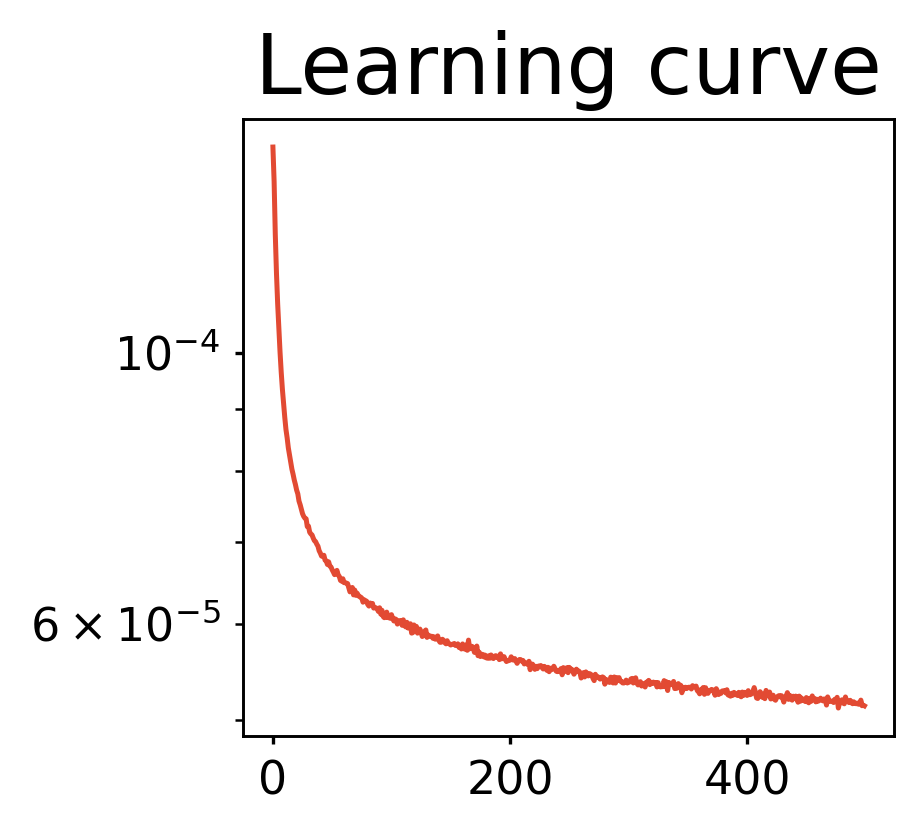

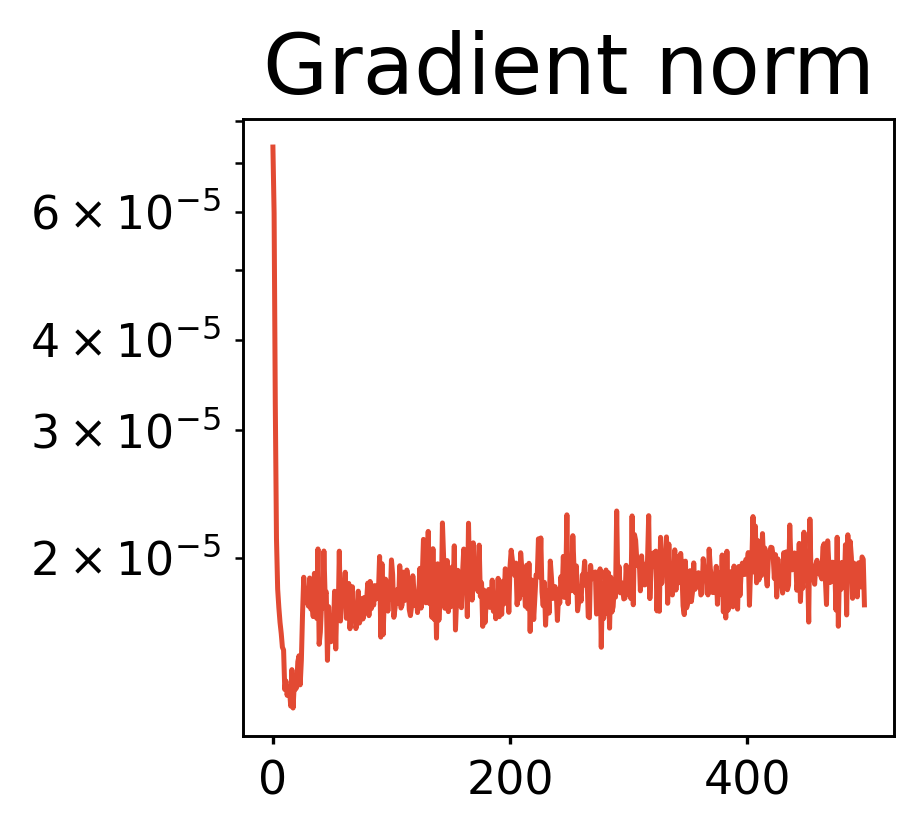

In [ ]:
#%%
# =============================================================================
#   Initialize and train networks
# =============================================================================
num_epochs = 500
#Initialize naive network
Net_temp = mm.RNN(num_inputs, hidden_size, output_size, Wi_init, Wo_init, Wrec_init, alpha=alpha) #initialize


loss_temp, wrec_temp = mm.train(Net_temp, Input_train, Output_train, Mask_train, datadir=datadir, n_epochs=num_epochs, plot_learning_curve=True, plot_gradient=True,
                              lr=lr, clip_gradient = 2.,  cuda=True, save_loss=True, save_params=True, adam=True) # added the checkpoint_dir and checkpoint_frequency



## Weights

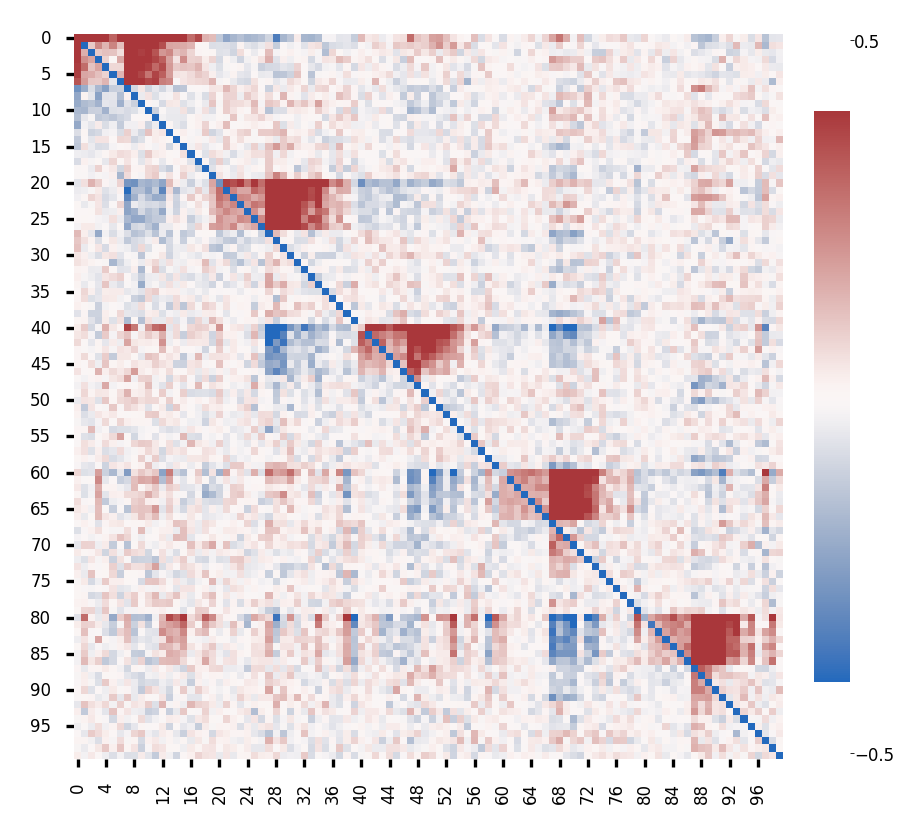

In [ ]:
# Create heatmap
ax = sns.heatmap(wrec_temp[0:100, 0:100], cmap='vlag', vmin=-0.4, vmax=0.4, cbar=False)
ax.tick_params(axis='both', labelsize=4)
# Get colorbar from the axes object
cb = plt.colorbar(ax.collections[0], fraction=0.046, pad=0.04)

cb.outline.set_visible(False)
cb.set_ticks([0.5, -0.5])
cb.ax.tick_params(labelsize=4)
cb.ax.tick_params(length=1, width=0.2, pad=0)
# plt.savefig(datadir/'wrec_noamp_patterns.pdf')

In [ ]:
def create_weight_visualization(weights, epoch, output_path, vmin=-0.5, vmax=0.5):
    """
    Create and save a heatmap visualization of network weights for a given epoch
    """
    plt.figure(figsize=(8, 6))

    # Create heatmap
    ax = sns.heatmap(weights, cmap='vlag', vmin=vmin, vmax=vmax, cbar=False)
    plt.tick_params(axis='both', labelsize=4)

    # Add colorbar
    cb = plt.colorbar(ax.collections[0], fraction=0.046, pad=0.04)
    cb.outline.set_visible(False)
    cb.set_ticks([vmin, vmax])
    cb.ax.tick_params(labelsize=4)
    cb.ax.tick_params(length=1, width=0.2, pad=0)

    # Add epoch number as title
    plt.title(f'Epoch {epoch}', fontsize=8)

    # Save the plot
    plt.savefig(output_path, dpi=300, bbox_inches='tight')
    plt.close()


def generate_weight_animation(checkpoint_dir, output_video_path, model_class, fps=5):
    """
    Generate an animation from weight visualizations across training checkpoints

    Parameters:
    checkpoint_dir (str): Directory containing checkpoint files
    output_video_path (str): Path where the output video will be saved
    model_class: The network model class to load checkpoints into
    fps (int): Frames per second for the output video
    """
    # Create temporary directory for frames
    temp_dir = 'temp_frames'
    os.makedirs(checkpoint_dir+temp_dir, exist_ok=True)

    # Get all checkpoint files, sorted by epoch number
    checkpoint_files = glob.glob(os.path.join(checkpoint_dir, 'checkpoint_epoch_*.pth'))
    checkpoint_files.sort(key=lambda x: int(x.split('_')[-1].split('.')[0]))

    frame_paths = []

    # Process each checkpoint
    for checkpoint_file in checkpoint_files:
        # Load checkpoint
        checkpoint = torch.load(checkpoint_file)
        weights = checkpoint['model_state_dict']
        epoch = checkpoint['epoch']

        # Extract wrec weights and convert to numpy array
        wrec_weights = weights['wrec'].cpu().detach().numpy()

        # Create frame filename
        frame_path = os.path.join(checkpoint_dir+temp_dir, f'frame_{epoch:04d}.png')
        frame_paths.append(frame_path)

        # Create and save visualization
        create_weight_visualization(wrec_weights, epoch, frame_path)

    # Create video from frames with QuickTime-compatible settings
    clip = ImageSequenceClip(frame_paths, fps=fps)

    # Export with QuickTime-compatible settings
    clip.write_videofile(
        checkpoint_dir+output_video_path,
        codec='mpeg4',  # Changed from libx264 to mpeg4
        fps=fps,
        bitrate='2000k',  # Added explicit bitrate
        preset='medium',  # Added preset for better compatibility
        audio=False  # Explicitly disable audio
    )

    # Clean up temporary frame files
    for frame_path in frame_paths:
        os.remove(frame_path)
    os.rmdir(checkpoint_dir+temp_dir)

# Example usage:
if __name__ == "__main__":
    checkpoint_dir = '/content/drive/My Drive/Colab Notebooks/amp_training_newonly_checkpoints/'
    output_video = 'weight_evolution_amp_training.mp4'

    generate_weight_animation(
        checkpoint_dir=checkpoint_dir,
        output_video_path=output_video,
        model_class=Net_temp,  # Your network class
        fps=5
    )

  checkpoint = torch.load(checkpoint_file)

  checkpoint = torch.load(checkpoint_file)

  checkpoint = torch.load(checkpoint_file)

  checkpoint = torch.load(checkpoint_file)

  checkpoint = torch.load(checkpoint_file)

  checkpoint = torch.load(checkpoint_file)

  checkpoint = torch.load(checkpoint_file)

  checkpoint = torch.load(checkpoint_file)

  checkpoint = torch.load(checkpoint_file)

  checkpoint = torch.load(checkpoint_file)

  checkpoint = torch.load(checkpoint_file)

  checkpoint = torch.load(checkpoint_file)

  checkpoint = torch.load(checkpoint_file)

  checkpoint = torch.load(checkpoint_file)

  checkpoint = torch.load(checkpoint_file)

  checkpoint = torch.load(checkpoint_file)

  checkpoint = torch.load(checkpoint_file)

  checkpoint = torch.load(checkpoint_file)

  checkpoint = torch.load(checkpoint_file)

  checkpoint = torch.load(checkpoint_file)

  checkpoint = torch.load(checkpoint_file)

  checkpoint = torch.load(checkpoint_file)

  checkpoint = torch.load(checkp

Moviepy - Building video /content/drive/My Drive/Colab Notebooks/amp_training_newonly_checkpoints/weight_evolution_amp_training.mp4.
Moviepy - Writing video /content/drive/My Drive/Colab Notebooks/amp_training_newonly_checkpoints/weight_evolution_amp_training.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/Colab Notebooks/amp_training_newonly_checkpoints/weight_evolution_amp_training.mp4


  func(*args, **kwargs)

  fig.canvas.print_figure(bytes_io, **kw)



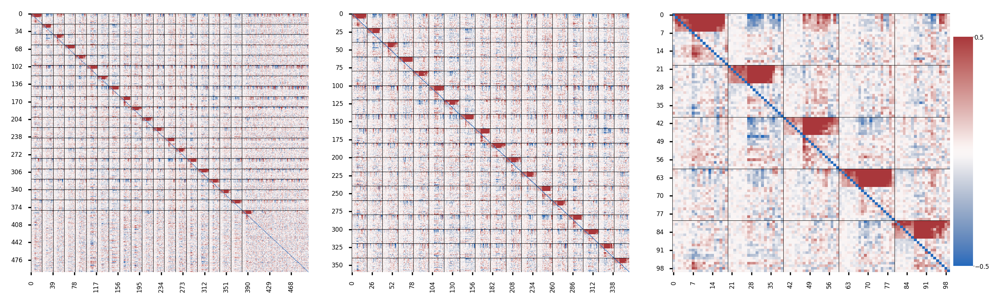

In [ ]:
epoch_num = 600
checkpoint_path = f'/content/drive/My Drive/Colab Notebooks/second_training/checkpoint_epoch_{epoch_num}.pth'
checkpoint = load_checkpoint(checkpoint_path, Net_temp)

weights = checkpoint['model_state_dict']     # Get the weights
epoch = checkpoint['epoch']                  # Get the epoch number
loss = checkpoint['loss']                    # Get the loss

# Figure
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(9, 3))

# First heatmap
sns.heatmap(weights['wrec'].cpu().detach(),
            cmap='vlag',
            vmin=-0.5,
            vmax=0.5,
            cbar=False,
            ax=ax1)

# Customize first heatmap
ax1.tick_params(axis='both', labelsize=4)
for i in range(20):
    ax1.axvline(i*20, color='k', lw=0.25)
    ax1.axhline(i*20, color='k', lw=0.25)

# Second heatmap
sns.heatmap(weights['wrec'].cpu().detach()[:360, :360],  # Replace with your second matrix
            cmap='vlag',
            vmin=-0.5,
            vmax=0.5,
            cbar=False,
            ax=ax2)

# Customize second heatmap
ax2.tick_params(axis='both', labelsize=4)
for i in range(20):
    ax2.axvline(i*20, color='k', lw=0.25)
    ax2.axhline(i*20, color='k', lw=0.25)

# Third heatmap
sns.heatmap(weights['wrec'].cpu().detach()[:100, :100],  # Replace with your second matrix
            cmap='vlag',
            vmin=-0.5,
            vmax=0.5,
            cbar=False,
            ax=ax3)

# Customize second heatmap
ax3.tick_params(axis='both', labelsize=4)
for i in range(20):
    ax3.axvline(i*20, color='k', lw=0.25)
    ax3.axhline(i*20, color='k', lw=0.25)

# Add a single colorbar that works for both plots
cbar_ax = fig.add_axes([0.98, 0.15, 0.02, 0.7])  # [left, bottom, width, height]
cbar = fig.colorbar(ax1.collections[0], cax=cbar_ax)
cbar.outline.set_visible(False)
cbar.set_ticks([0.5, -0.5])
cbar.ax.tick_params(labelsize=4)
cbar.ax.tick_params(length=1, width=0.2, pad=0)

# Adjust the layout to prevent overlap
# plt.tight_layout()

# plt.savefig(figs_dir/'third_training_weights.pdf')

In [ ]:
def reorder_matrix(matrix, reorder_list, group_size=20):
    # Verify matrix dimensions
    if matrix.shape[0] != matrix.shape[1] or matrix.shape[0] % group_size != 0:
        raise ValueError("Matrix must be square and divisible by group_size")

    n_groups = matrix.shape[0] // group_size  # Should be 20 for 400x400 matrix

    # Create index mapping for both rows and columns
    new_indices = np.concatenate([np.arange(i*group_size, (i+1)*group_size)
                                for i in reorder_list])

    # Reorder both rows and columns using the same permutation
    reordered_matrix = matrix[new_indices][:, new_indices]

    return reordered_matrix

In [ ]:
new_matrix = reorder_matrix(weights['wrec'].cpu().detach()[:400, :400], unnatural, group_size=20)

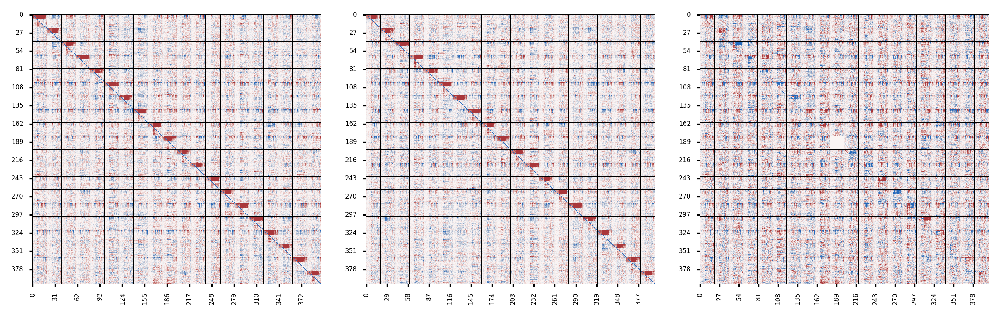

In [ ]:
# Figure
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(9, 3))

# First heatmap
sns.heatmap(weights['wrec'].cpu().detach()[:400, :400],
            cmap='vlag',
            vmin=-0.5,
            vmax=0.5,
            cbar=False,
            ax=ax1)

# Customize first heatmap
ax1.tick_params(axis='both', labelsize=4)
for i in range(20):
    ax1.axvline(i*20, color='k', lw=0.25)
    ax1.axhline(i*20, color='k', lw=0.25)

# Second heatmap
sns.heatmap(new_matrix,  # Replace with your second matrix
            cmap='vlag',
            vmin=-0.5,
            vmax=0.5,
            cbar=False,
            ax=ax2)

# Customize second heatmap
ax2.tick_params(axis='both', labelsize=4)
for i in range(20):
    ax2.axvline(i*20, color='k', lw=0.25)
    ax2.axhline(i*20, color='k', lw=0.25)

# Third heatmap
sns.heatmap((weights['wrec'].cpu().detach()[:400, :400] - new_matrix),  # Replace with your second matrix
            cmap='vlag',
            vmin=-0.5,
            vmax=0.5,
            cbar=False,
            ax=ax3)

# Customize second heatmap
ax3.tick_params(axis='both', labelsize=4)
for i in range(20):
    ax3.axvline(i*20, color='k', lw=0.25)
    ax3.axhline(i*20, color='k', lw=0.25)

# plt.savefig(figs_dir/'third_training_weights_reordered.pdf')

In [ ]:
epoch_num = 600
checkpoint_first = f'/content/drive/My Drive/Colab Notebooks/third_training/checkpoint_epoch_{epoch_num}.pth'
epoch_num = 600
checkpoint_second = f'/content/drive/My Drive/Colab Notebooks/second_training/checkpoint_epoch_{epoch_num}.pth'
# checkpoint_third = f'/content/drive/My Drive/Colab Notebooks/test/checkpoint_epoch_{epoch_num}.pth'
checkpoint1 = load_checkpoint(checkpoint_first, Net_temp)
checkpoint2 = load_checkpoint(checkpoint_second, Net_temp)
# checkpoint3 = load_checkpoint(checkpoint_third, Net_temp)

weights1 = checkpoint1['model_state_dict']     # Get the weights
weights2 = checkpoint2['model_state_dict']
# weights3 = checkpoint3['model_state_dict']

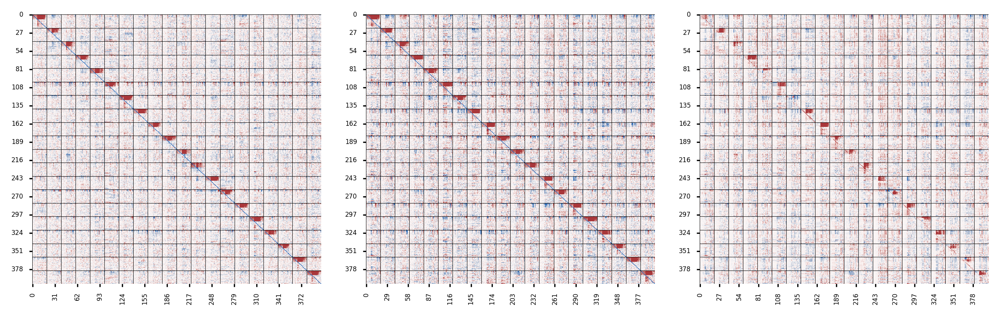

In [ ]:
# Figure
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(9, 3))

# First heatmap
sns.heatmap(weights1['wrec'].cpu().detach()[:400, :400],
            cmap='vlag',
            vmin=-0.5,
            vmax=0.5,
            cbar=False,
            ax=ax1)

# Customize first heatmap
ax1.tick_params(axis='both', labelsize=4)
for i in range(20):
    ax1.axvline(i*20, color='k', lw=0.25)
    ax1.axhline(i*20, color='k', lw=0.25)

new_matrix = reorder_matrix(weights2['wrec'].cpu().detach()[:400, :400], unnatural, group_size=20)

sns.heatmap(weights2['wrec'].cpu().detach()[:400, :400],
            cmap='vlag',
            vmin=-0.5,
            vmax=0.5,
            cbar=False,
            ax=ax2)

# Customize first heatmap
ax2.tick_params(axis='both', labelsize=4)
for i in range(20):
    ax2.axvline(i*20, color='k', lw=0.25)
    ax2.axhline(i*20, color='k', lw=0.25)

new_matrix = reorder_matrix(weights2['wrec'].cpu().detach()[:400, :400]-weights1['wrec'].cpu().detach()[:400, :400], unnatural, group_size=20)

sns.heatmap(weights2['wrec'].cpu().detach()[:400, :400]-weights1['wrec'].cpu().detach()[:400, :400],
            cmap='vlag',
            vmin=-0.5,
            vmax=0.5,
            cbar=False,
            ax=ax3)

# Customize first heatmap
ax3.tick_params(axis='both', labelsize=4)
for i in range(20):
    ax3.axvline(i*20, color='k', lw=0.25)
    ax3.axhline(i*20, color='k', lw=0.25)

plt.savefig(figs_dir/'second-third_weights.pdf')

# SVD

In [ ]:
# Get all checkpoint files, sorted by epoch number
checkpoint_dir = '/content/drive/My Drive/Colab Notebooks/first_training/'
checkpoint_files = glob.glob(os.path.join(checkpoint_dir, 'checkpoint_epoch_*.pth'))
checkpoint_files.sort(key=lambda x: int(x.split('_')[-1].split('.')[0]))

first_wrec_weights = []

# Process each checkpoint
for checkpoint_file in checkpoint_files:
    # Load checkpoint
    checkpoint = torch.load(checkpoint_file)
    weights = checkpoint['model_state_dict']
    epoch = checkpoint['epoch']

    # Extract wrec weights and convert to numpy array
    first_wrec_weights.append(weights['wrec'].cpu().detach().numpy())

  checkpoint = torch.load(checkpoint_file)



In [ ]:
# Get all checkpoint files, sorted by epoch number
checkpoint_dir = '/content/drive/My Drive/Colab Notebooks/second_training/'
checkpoint_files = glob.glob(os.path.join(checkpoint_dir, 'checkpoint_epoch_*.pth'))
checkpoint_files.sort(key=lambda x: int(x.split('_')[-1].split('.')[0]))

second_wrec_weights = []

# Process each checkpoint
for checkpoint_file in checkpoint_files:
    # Load checkpoint
    checkpoint = torch.load(checkpoint_file)
    weights = checkpoint['model_state_dict']
    epoch = checkpoint['epoch']

    # Extract wrec weights and convert to numpy array
    second_wrec_weights.append(weights['wrec'].cpu().detach().numpy())

  checkpoint = torch.load(checkpoint_file)



In [ ]:
# Get all checkpoint files, sorted by epoch number
checkpoint_dir = '/content/drive/My Drive/Colab Notebooks/third_training/'
checkpoint_files = glob.glob(os.path.join(checkpoint_dir, 'checkpoint_epoch_*.pth'))
checkpoint_files.sort(key=lambda x: int(x.split('_')[-1].split('.')[0]))

third_wrec_weights = []

# Process each checkpoint
for checkpoint_file in checkpoint_files:
    # Load checkpoint
    checkpoint = torch.load(checkpoint_file)
    weights = checkpoint['model_state_dict']
    epoch = checkpoint['epoch']

    # Extract wrec weights and convert to numpy array
    third_wrec_weights.append(weights['wrec'].cpu().detach().numpy())

  checkpoint = torch.load(checkpoint_file)



In [ ]:
new_matrix = reorder_matrix(third_wrec_weights[-1][:400, :400], unnatural, group_size=20)

In [ ]:
weight_matrix = first_wrec_weights[-1]

In [ ]:
a = 7
b = 20
c = 0
d = 7
i = 0
strong_to_weak_means = []
while i < num_inputs:
  strong_to_weak_means.append(weight_matrix[a:b, c:d].mean())
  a += 20
  b += 20
  c += 20
  d += 20
  i += 1

In [ ]:
a = 0
b = 7
c = 0
d = 7
i = 0
strong_to_strong_means = []
while i < num_inputs:
  strong_to_strong_means.append(weight_matrix[a:b, c:d].mean())
  a += 20
  b += 20
  c += 20
  d += 20
  i += 1

In [ ]:
a = 0
b = 7
c = 7
d = 20
i = 0
weak_to_strong_means = []
while i < num_inputs:
  weak_to_strong_means.append(weight_matrix[a:b, c:d].mean())
  a += 20
  b += 20
  c += 20
  d += 20
  i += 1

In [ ]:
a = 7
b = 20
c = 7
d = 20
i = 0
weak_to_weak_means = []
while i < num_inputs:
  weak_to_weak_means.append(weight_matrix[a:b, c:d].mean())
  a += 20
  b += 20
  c += 20
  d += 20
  i += 1

In [ ]:
a = 20
b = 40
c = 0
d = 20
i = 0
prior_to_next_means = []
while i < num_inputs:
  prior_to_next_means.append(weight_matrix[a:b, c:d].mean())
  a += 20
  b += 20
  c += 20
  d += 20
  i += 1

In [ ]:
a = 20
b = 40
c = 0
d = 7
i = 0
prior_strong_to_next_means = []
while i < num_inputs:
  prior_strong_to_next_means.append(weight_matrix[a:b, c:d].mean())
  a += 20
  b += 20
  c += 20
  d += 20
  i += 1

In [ ]:
a = 20
b = 40
c = 7
d = 20
i = 0
prior_weak_to_next_means = []
while i < num_inputs:
  prior_weak_to_next_means.append(weight_matrix[a:b, c:d].mean())
  a += 20
  b += 20
  c += 20
  d += 20
  i += 1

In [ ]:
a = 20
b = 27
c = 0
d = 7
i = 0
prior_strong_to_next_strong_means = []
while i < num_inputs:
  prior_strong_to_next_strong_means.append(weight_matrix[a:b, c:d].mean())
  a += 20
  b += 20
  c += 20
  d += 20
  i += 1

In [ ]:
a = 20
b = 27
c = 7
d = 20
i = 0
prior_weak_to_next_strong_means = []
while i < num_inputs:
  prior_weak_to_next_strong_means.append(weight_matrix[a:b, c:d].mean())
  a += 20
  b += 20
  c += 20
  d += 20
  i += 1

In [ ]:
a = 27
b = 40
c = 0
d = 7
i = 0
prior_strong_to_next_weak_means = []
while i < num_inputs:
  prior_strong_to_next_weak_means.append(weight_matrix[a:b, c:d].mean())
  a += 20
  b += 20
  c += 20
  d += 20
  i += 1

In [ ]:
a = 27
b = 40
c = 7
d = 20
i = 0
prior_weak_to_next_weak_means = []
while i < num_inputs:
  prior_weak_to_next_weak_means.append(weight_matrix[a:b, c:d].mean())
  a += 20
  b += 20
  c += 20
  d += 20
  i += 1

  plt.grid(False, alpha=0.3)



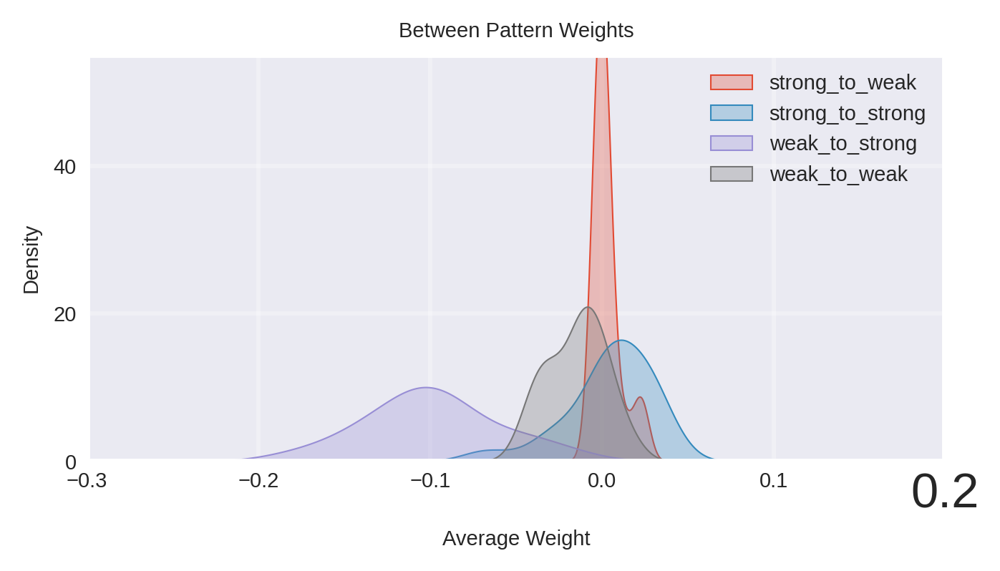

In [ ]:
# Set the style
plt.style.use('seaborn-v0_8-darkgrid')
sns.set_context("talk")

# Create figure and axis
plt.figure(figsize=(5, 3))

# Plot the distributions using KDE (Kernel Density Estimation) for smooth curves
sns.kdeplot(prior_strong_to_next_weak_means, label='strong_to_weak', fill=True, alpha=0.3, lw=0.5)
sns.kdeplot(prior_strong_to_next_strong_means, label='strong_to_strong', fill=True, alpha=0.3, lw=0.5)
sns.kdeplot(prior_weak_to_next_strong_means, label='weak_to_strong', fill=True, alpha=0.3, lw=0.5)
sns.kdeplot(prior_weak_to_next_weak_means, label='weak_to_weak', fill=True, alpha=0.3, lw=0.5)

# Add labels and title
plt.tick_params(axis='x', length=0)
plt.tick_params(axis='y', length=0)

plt.title('Between Pattern Weights', fontsize=7)
plt.xlabel('Average Weight', fontsize=7)
plt.ylabel('Density', fontsize=7)
plt.legend(fontsize=7)
plt.xticks(fontsize=7)
plt.yticks(fontsize=7)
plt.xlim(-0.3, 0.2)
plt.ylim(0,55)
# Add grid lines
plt.grid(False, alpha=0.3)


# Adjust layout and display
# plt.tight_layout(rect=[0, 0.05, 1, 0.95])
plt.show()

  plt.grid(False, alpha=0.3)



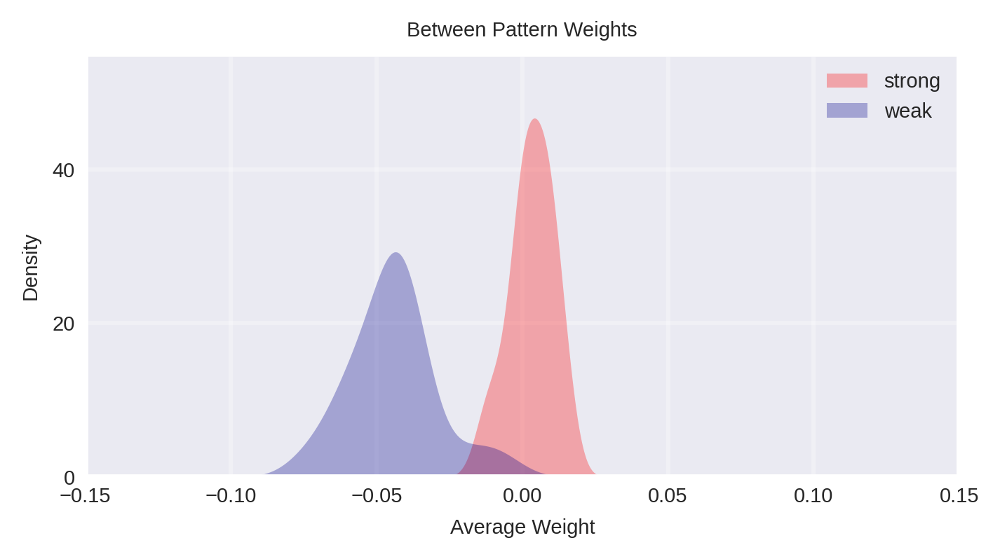

In [ ]:
# Set the style
plt.style.use('seaborn-v0_8-darkgrid')
sns.set_context("talk")

# Create figure and axis
plt.figure(figsize=(5, 3))

# Plot the distributions using KDE (Kernel Density Estimation) for smooth curves
sns.kdeplot(prior_strong_to_next_means, label='strong', color='red', fill=True, alpha=0.3, lw=0)
# sns.kdeplot(strong_to_strong_means, label='strong_to_strong', fill=True, alpha=0.3, lw=0.5)
sns.kdeplot(prior_weak_to_next_means, label='weak', color='darkblue', fill=True, alpha=0.3, lw=0)
# sns.kdeplot(weak_to_weak_means, label='weak_to_weak', fill=True, alpha=0.3, lw=0.5)

# Add labels and title
plt.tick_params(axis='x', length=0)
plt.tick_params(axis='y', length=0)

plt.title('Between Pattern Weights', fontsize=7)
plt.xlabel('Average Weight', fontsize=7)
plt.ylabel('Density', fontsize=7)
plt.legend(fontsize=7)
plt.xticks(fontsize=7)
plt.yticks(fontsize=7)
plt.xlim(-0.15,0.15)
plt.ylim(0,55)
# Add grid lines
plt.grid(False, alpha=0.3)


# Adjust layout and display
# plt.tight_layout(rect=[0, 0.05, 1, 0.95])
plt.show()

  plt.grid(False, alpha=0.3)



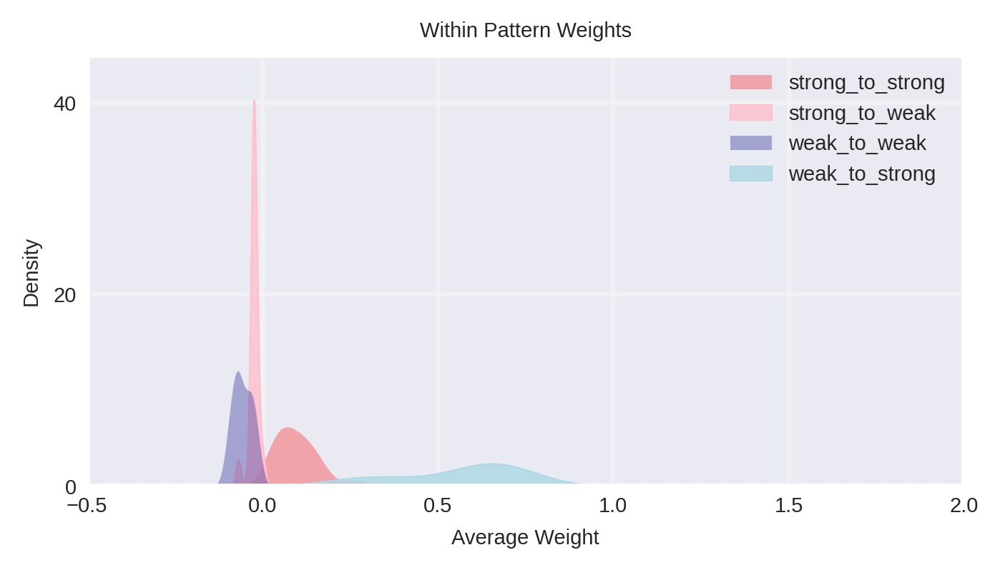

In [ ]:
# Set the style
plt.style.use('seaborn-v0_8-darkgrid')
sns.set_context("talk")

# Create figure and axis
plt.figure(figsize=(5, 3))

# Plot the distributions using KDE (Kernel Density Estimation) for smooth curves
sns.kdeplot(strong_to_strong_means, label='strong_to_strong', color='red', fill=True, alpha=0.3, lw=0)
sns.kdeplot(strong_to_weak_means, label='strong_to_weak', color='pink', fill=True, alpha=0.8, lw=0.5)
sns.kdeplot(weak_to_weak_means, label='weak_to_weak', color='darkblue', fill=True, alpha=0.3, lw=0)
sns.kdeplot(weak_to_strong_means, label='weak_to_strong', color='lightblue', fill=True, alpha=0.8, lw=0.5)

# Add labels and title
plt.tick_params(axis='x', length=0)
plt.tick_params(axis='y', length=0)

plt.title('Within Pattern Weights', fontsize=7)
plt.xlabel('Average Weight', fontsize=7)
plt.ylabel('Density', fontsize=7)
plt.legend(fontsize=7)
plt.xticks([-0.5, 0.0, 0.5, 1.0, 1.5, 2.0],fontsize=7)
plt.yticks(fontsize=7)
plt.xlim(-0.5, 2)
plt.ylim(0,45)
# Add grid lines
plt.grid(False, alpha=0.3)


# Adjust layout and display
# plt.tight_layout(rect=[0, 0.05, 1, 0.95])
plt.show()


In [ ]:
"""
# RNN Weight Matrix Analysis Toolkit
This notebook provides tools for analyzing the weight matrices of recurrent neural networks (RNNs)
across training to understand circuit transformation. The focus is on SVD analysis along with
other complementary techniques.
"""

# Set default styling for plots
plt.style.use('seaborn-v0_8-whitegrid')
sns.set_context("notebook", font_scale=1.5)

class RNNWeightAnalyzer:
    """
    A class for analyzing RNN weight matrices across training checkpoints.
    """

    def __init__(self, weight_matrices, checkpoint_labels=None):
        """
        Initialize with a list of weight matrices from different training checkpoints.

        Args:
            weight_matrices: List of numpy arrays or PyTorch tensors representing weight matrices
            checkpoint_labels: Optional list of labels for each checkpoint (e.g., epoch numbers)
        """
        # Convert all weights to numpy arrays if they're PyTorch tensors
        self.weights = [w.detach().cpu().numpy() if isinstance(w, torch.Tensor) else w for w in weight_matrices]

        # Set checkpoint labels
        if checkpoint_labels is None:
            self.checkpoint_labels = [f"Checkpoint {i*10}" for i in range(len(self.weights))]
        else:
            self.checkpoint_labels = checkpoint_labels

        # Perform SVD on all weight matrices
        self.svd_results = []
        for w in self.weights:
            U, S, Vt = np.linalg.svd(w, full_matrices=False)
            self.svd_results.append((U, S, Vt))

    def plot_singular_value_evolution(self, top_k=None, figsize=(12, 8)):
        """
        Plot the evolution of singular values across training checkpoints.

        Args:
            top_k: Number of top singular values to plot (None for all)
            figsize: Size of the figure
        """
        plt.figure(figsize=figsize)

        # Determine how many singular values to plot
        if top_k is None:
            top_k = min(len(s) for _, s, _ in self.svd_results)
        else:
            top_k = min(top_k, min(len(s) for _, s, _ in self.svd_results))

        # Extract singular values for each checkpoint
        all_singular_values = np.array([s[:top_k] for _, s, _ in self.svd_results])

        # Plot each singular value's evolution
        for i in range(top_k):
            plt.plot(all_singular_values[:, i], marker='o', label=f"SV {i+1}")

        plt.xlabel("Training Checkpoint")
        plt.ylabel("Singular Value")
        plt.title("Evolution of Top Singular Values During Training")
        # plt.xticks(range(len(self.checkpoint_labels)), self.checkpoint_labels, rotation=45)
        plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), ncol=5)
        plt.tight_layout()
        plt.grid(True)
        return plt.gcf()

    def plot_singular_value_distributions(self, figsize=(15, 10)):
        """
        Plot the distribution of singular values at each checkpoint.
        """
        n_checkpoints = len(self.weights)
        n_cols = min(n_checkpoints, 3)
        n_rows = (n_checkpoints + n_cols - 1) // n_cols

        fig, axes = plt.subplots(n_rows, n_cols, figsize=figsize)
        if n_rows == 1 and n_cols == 1:
            axes = np.array([axes])
        axes = axes.flatten()

        for i, (_, S, _) in enumerate(self.svd_results):
            if i < len(axes):
                ax = axes[i]
                ax.bar(range(1, len(S) + 1), S)
                # ax.set_title(f"{self.checkpoint_labels[i]}")
                ax.set_xlabel("Index")
                ax.set_ylabel("Singular Value")
                ax.set_yscale('log')

        # Hide unused subplots
        for j in range(i + 1, len(axes)):
            axes[j].axis('off')

        plt.suptitle("Singular Value Distributions Across Training", fontsize=16)
        plt.tight_layout(rect=[0, 0, 1, 0.95])
        return fig

    def plot_effective_rank(self, threshold=0.01, figsize=(10, 6), fontsize=7):
        """
        Plot the effective rank of the weight matrix over training.
        Effective rank is defined as the number of singular values
        above a certain threshold relative to the largest singular value.

        Args:
            threshold: Threshold for determining significant singular values
            figsize: Size of the figure
        """
        plt.figure(figsize=figsize)

        effective_ranks = []
        for _, S, _ in self.svd_results:
            # Calculate threshold relative to the largest singular value
            threshold_value = threshold * S[0]
            # Count singular values above threshold
            rank = np.sum(S > threshold_value)
            effective_ranks.append(rank)

        plt.plot(effective_ranks, marker='o', linestyle='-', linewidth=2)
        plt.xlabel("Training Checkpoint", fontsize=fontsize)
        plt.ylabel("Effective Rank", fontsize=fontsize)
        plt.title(f"Effective Rank Evolution (threshold={threshold})", fontsize=fontsize)
        plt.xticks(fontsize=fontsize)
        plt.yticks(fontsize=fontsize)
        plt.grid(True)
        plt.tight_layout()
        return plt.gcf()

    def plot_weight_change_trajectory(self, method='pca', figsize=(12, 10)):
        """
        Visualize the trajectory of weight changes during training
        using dimensionality reduction.

        Args:
            method: 'pca' or 'tsne' for dimensionality reduction
            figsize: Size of the figure
        """
        # Flatten weight matrices
        flattened_weights = [w.flatten() for w in self.weights]

        # Stack for dimensionality reduction
        stacked_weights = np.vstack(flattened_weights)

        # Apply dimensionality reduction
        if method.lower() == 'pca':
            reducer = PCA(n_components=3)
            reduced_weights = reducer.fit_transform(stacked_weights)
            method_name = 'PCA'
        elif method.lower() == 'tsne':
            reducer = TSNE(n_components=3, random_state=42)
            reduced_weights = reducer.fit_transform(stacked_weights)
            method_name = 't-SNE'
        else:
            raise ValueError("Method must be 'pca' or 'tsne'")

        # Plot 3D trajectory
        fig = plt.figure(figsize=figsize)
        ax = plt.axes(projection='3d')

        ax.plot(reduced_weights[:, 0], reduced_weights[:, 1], reduced_weights[:, 2],
                'o-', linewidth=2, markersize=10)

        # Add labels for each checkpoint
        # for i, label in enumerate(self.checkpoint_labels):
        #     ax.text(reduced_weights[i, 0], reduced_weights[i, 1], reduced_weights[i, 2], label)

        ax.set_xlabel(f"{method_name} Component 1")
        ax.set_ylabel(f"{method_name} Component 2")
        ax.set_zlabel(f"{method_name} Component 3")
        ax.set_title(f"Weight Matrix Trajectory in {method_name} Space")

        return fig

    def visualize_principal_modes(self, checkpoint_idx, top_k=3, figsize=(15, 5)):
        """
        Visualize the top-k principal modes (singular vectors) at a given checkpoint.

        Args:
            checkpoint_idx: Index of the checkpoint to analyze
            top_k: Number of top modes to visualize
            figsize: Size of the figure
        """
        U, S, Vt = self.svd_results[checkpoint_idx]

        # Get the weight matrix shape for reshaping visualization
        weight_shape = self.weights[checkpoint_idx].shape

        fig, axes = plt.subplots(2, top_k, figsize=figsize)

        # Plot top-k left singular vectors (output directions)
        for i in range(top_k):
            if weight_shape[0] <= weight_shape[1]:  # If we have more inputs than outputs
                matrix_shape = (1, weight_shape[0])
            else:
                matrix_shape = (weight_shape[0] // weight_shape[1], weight_shape[1])

            try:
                # Try to reshape for visualization if possible
                reshaped_u = U[:, i].reshape(matrix_shape)
                sns.heatmap(reshaped_u, cmap='coolwarm', center=0, ax=axes[0, i])
            except:
                # If reshaping fails, just plot as a 1D vector
                axes[0, i].plot(U[:, i])

            axes[0, i].set_title(f"Left SV {i+1}")

        # Plot top-k right singular vectors (input directions)
        for i in range(top_k):
            if weight_shape[1] <= weight_shape[0]:  # If we have more outputs than inputs
                matrix_shape = (1, weight_shape[1])
            else:
                matrix_shape = (weight_shape[1] // weight_shape[0], weight_shape[0])

            try:
                # Try to reshape for visualization if possible
                reshaped_v = Vt[i, :].reshape(matrix_shape)
                sns.heatmap(reshaped_v, cmap='coolwarm', center=0, ax=axes[1, i])
            except:
                # If reshaping fails, just plot as a 1D vector
                axes[1, i].plot(Vt[i, :])

            axes[1, i].set_title(f"Right SV {i+1}")

        # plt.suptitle(f"Principal Modes at {self.checkpoint_labels[checkpoint_idx]}", fontsize=16)
        plt.tight_layout(rect=[0, 0, 1, 0.95])
        return fig

    def compute_alignment_across_training(self, mode_idx=0):
        """
        Compute how well-aligned a specific singular vector is across training.
        This helps identify if the network preserves specific computational directions.

        Args:
            mode_idx: Index of the singular vector to track (default: 0 for top mode)

        Returns:
            Tuple of alignments for left and right singular vectors
        """
        # Get all left singular vectors (U) for the specified mode
        left_vectors = [result[0][:, mode_idx] for result in self.svd_results]

        # Get all right singular vectors (V) for the specified mode
        right_vectors = [result[2][mode_idx, :] for result in self.svd_results]

        # Compute pairwise alignments (absolute dot products) for left vectors
        left_alignments = np.zeros((len(left_vectors), len(left_vectors)))
        for i in range(len(left_vectors)):
            for j in range(len(left_vectors)):
                left_alignments[i, j] = np.abs(np.dot(left_vectors[i], left_vectors[j]))

        # Compute pairwise alignments for right vectors
        right_alignments = np.zeros((len(right_vectors), len(right_vectors)))
        for i in range(len(right_vectors)):
            for j in range(len(right_vectors)):
                right_alignments[i, j] = np.abs(np.dot(right_vectors[i], right_vectors[j]))

        return left_alignments, right_alignments

    def plot_mode_alignment(self, mode_idx=0, figsize=(18, 8)):
        """
        Plot the alignment of a specific mode across training checkpoints.

        Args:
            mode_idx: Index of the mode to track
            figsize: Size of the figure
        """
        left_align, right_align = self.compute_alignment_across_training(mode_idx)

        fig, axes = plt.subplots(1, 2, figsize=figsize)

        # Plot left singular vector alignments
        sns.heatmap(left_align, annot=False, fmt=".2f", cmap="YlGnBu",
                    ax=axes[0])
        axes[0].set_title(f"Left Singular Vector {mode_idx+1} Alignment")

        # Plot right singular vector alignments
        sns.heatmap(right_align, annot=False, fmt=".2f", cmap="YlGnBu",
                    ax=axes[1])
        axes[1].set_title(f"Right Singular Vector {mode_idx+1} Alignment")

        plt.suptitle(f"Alignment of Mode {mode_idx+1} Across Training", fontsize=16)
        plt.tight_layout(rect=[0, 0, 1, 0.95])
        return fig

    def connectivity_analysis(self, checkpoint_idx, threshold=0.1):
        """
        Analyze the connectivity patterns in the weight matrix.

        Args:
            checkpoint_idx: Index of the checkpoint to analyze
            threshold: Threshold for considering a connection significant

        Returns:
            networkx Graph object representing the connectivity
        """
        weight_matrix = self.weights[checkpoint_idx]

        # Create a directed graph
        G = nx.DiGraph()

        # Add nodes
        for i in range(weight_matrix.shape[0]):
            G.add_node(f"out_{i}")
        for j in range(weight_matrix.shape[1]):
            G.add_node(f"in_{j}")

        # Add edges with weights above threshold
        for i in range(weight_matrix.shape[0]):
            for j in range(weight_matrix.shape[1]):
                if abs(weight_matrix[i, j]) > threshold:
                    G.add_edge(f"in_{j}", f"out_{i}", weight=weight_matrix[i, j])

        return G

    def plot_connectivity_graph(self, checkpoint_idx, threshold=0.1, figsize=(12, 12)):
        """
        Plot the connectivity graph for a given checkpoint.

        Args:
            checkpoint_idx: Index of the checkpoint to analyze
            threshold: Threshold for considering a connection significant
            figsize: Size of the figure
        """
        G = self.connectivity_analysis(checkpoint_idx, threshold)

        plt.figure(figsize=figsize)

        # Set positions for nodes
        pos = nx.spring_layout(G, seed=42)

        # Get edge weights for line thickness
        edge_weights = [abs(G[u][v]['weight']) * 2 for u, v in G.edges()]

        # Draw the graph
        nx.draw_networkx_nodes(G, pos, node_size=100,
                              node_color=['blue' if n.startswith('in') else 'red' for n in G.nodes()])
        nx.draw_networkx_edges(G, pos, width=edge_weights, alpha=0.7,
                              edge_color=['green' if G[u][v]['weight'] > 0 else 'red'
                                          for u, v in G.edges()])
        nx.draw_networkx_labels(G, pos, font_size=8)

        plt.title(f"Connectivity Graph for {self.checkpoint_labels[checkpoint_idx]}")
        plt.axis('off')
        return plt.gcf()

    def plot_weight_norms(self, figsize=(10, 6), fontsize=7):
        """
        Plot the Frobenius norm of weight matrices across training.
        """
        norms = [np.linalg.norm(w) for w in self.weights]

        plt.figure(figsize=figsize)
        plt.plot(norms, marker='o', linestyle='-', linewidth=2, ms=0.5)
        plt.xlabel("Training Checkpoint", fontsize=fontsize)
        plt.ylabel("Frobenius Norm", fontsize=fontsize)
        plt.title("Weight Matrix Norm Across Training", fontsize=fontsize)
        plt.xticks(fontsize=fontsize)
        plt.yticks(fontsize=fontsize)
        plt.grid(True)
        plt.tight_layout()
        return plt.gcf()

    def eigenvalue_analysis(self, checkpoint_idx, figsize=(12, 10)):
        """
        Analyze eigenvalues of the weight matrix at a given checkpoint.
        This is especially useful for RNNs to understand temporal dynamics.

        Args:
            checkpoint_idx: Index of the checkpoint to analyze
            figsize: Size of the figure
        """
        weight_matrix = self.weights[checkpoint_idx]

        # For recurrent matrices, we're often interested in W^T @ W
        # This is valid if the matrix is square (recurrent connections)
        if weight_matrix.shape[0] == weight_matrix.shape[1]:
            # Calculate eigenvalues and eigenvectors
            eigenvalues, eigenvectors = np.linalg.eig(weight_matrix)

            # Sort by magnitude
            idx = np.argsort(np.abs(eigenvalues))[::-1]
            eigenvalues = eigenvalues[idx]
            eigenvectors = eigenvectors[:, idx]

            # Create figure with two subplots
            fig, (ax1, ax2) = plt.subplots(1, 2, figsize=figsize)

            # Plot eigenvalues in complex plane
            ax1.scatter(eigenvalues.real, eigenvalues.imag, s=100, alpha=0.7)

            # Add unit circle
            theta = np.linspace(0, 2*np.pi, 100)
            ax1.plot(np.cos(theta), np.sin(theta), 'k--', alpha=0.3)

            # Plot guidelines
            ax1.axhline(y=0, color='k', linestyle='-', alpha=0.3)
            ax1.axvline(x=0, color='k', linestyle='-', alpha=0.3)
            ax1.axvline(x=1, color='r', linestyle='--', alpha=0.3)
            ax1.axvline(x=-1, color='r', linestyle='--', alpha=0.3)

            ax1.set_xlabel("Real Part")
            ax1.set_ylabel("Imaginary Part")
            ax1.set_title("Eigenvalues in Complex Plane")
            ax1.grid(True)

            # Plot magnitudes
            magnitudes = np.abs(eigenvalues)
            ax2.bar(range(1, len(magnitudes) + 1), magnitudes)
            ax2.axhline(y=1, color='r', linestyle='--', alpha=0.7)
            ax2.set_xlabel("Index")
            ax2.set_ylabel("Magnitude")
            ax2.set_title("Eigenvalue Magnitudes")
            ax2.set_yscale('log')
            ax2.grid(True)

            plt.suptitle(f"Eigenvalue Analysis for {self.checkpoint_labels[checkpoint_idx]}",
                         fontsize=16)
            plt.tight_layout(rect=[0, 0, 1, 0.95])
            return fig
        else:
            print("Eigenvalue analysis requires a square matrix (recurrent connections)")
            return None

    def plot_condition_number(self, figsize=(10, 6)):
        """
        Plot the condition number of weight matrices across training.
        High condition numbers can indicate numerical instability.
        """
        condition_numbers = []
        for w in self.weights:
            # Use SVD to calculate condition number
            s = np.linalg.svd(w, compute_uv=False)
            condition_numbers.append(s[0] / s[-1])

        plt.figure(figsize=figsize)
        plt.semilogy(condition_numbers, marker='o', linestyle='-', linewidth=2)
        plt.xlabel("Training Checkpoint")
        plt.ylabel("Condition Number (log scale)")
        plt.title("Weight Matrix Condition Number Across Training")
        # plt.xticks(range(len(self.checkpoint_labels)), self.checkpoint_labels, rotation=45)
        plt.grid(True)
        plt.tight_layout()
        return plt.gcf()



In [ ]:
first_second =np.concatenate((first_wrec_weights, second_wrec_weights), axis=0)

In [ ]:
first_third = np.concatenate((first_wrec_weights, third_wrec_weights), axis=0)

In [ ]:
analyzer = RNNWeightAnalyzer(first_second)

In [ ]:
(_, S, _) = analyzer.svd_results[-1]

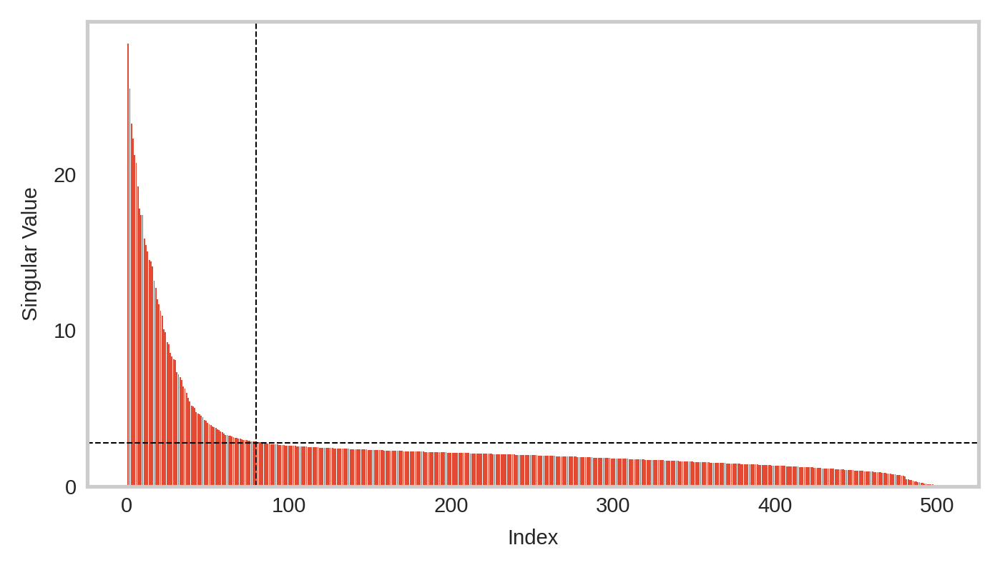

In [ ]:
plt.figure(figsize=(5, 3))
plt.bar(range(1, len(S) + 1), S)
# ax.set_title(f"{self.checkpoint_labels[i]}")
plt.xlabel("Index", fontsize=7)
plt.ylabel("Singular Value", fontsize=7)
# plt.yscale('log')
plt.xticks(fontsize=7)
plt.yticks(fontsize=7)
plt.tick_params(axis='x', length=0)
plt.tick_params(axis='y', length=0)
plt.axvline(80, color='k', linestyle='--', lw=0.5)
plt.axhline(2.8, color='k', linestyle='--', lw=0.5)
plt.grid(False)




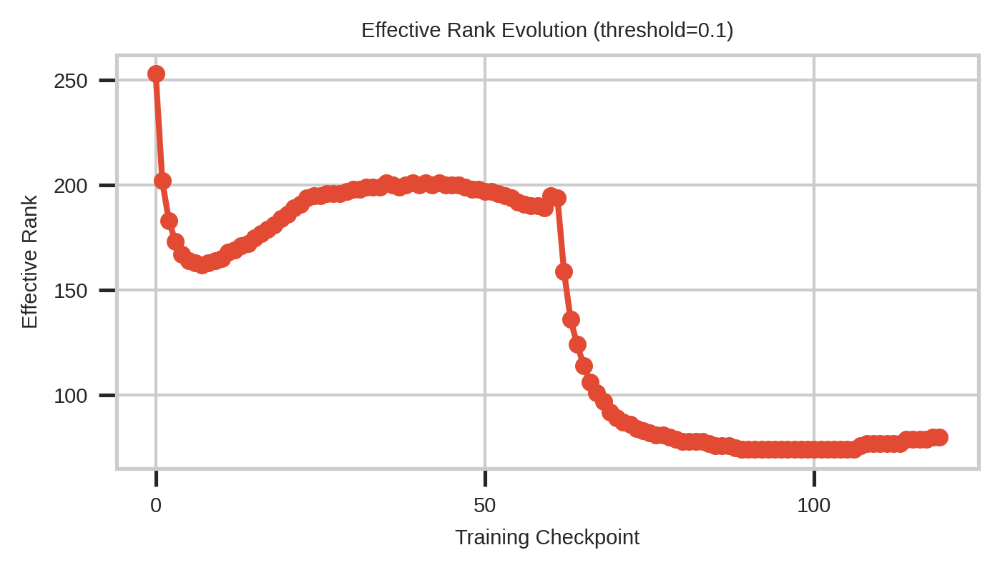

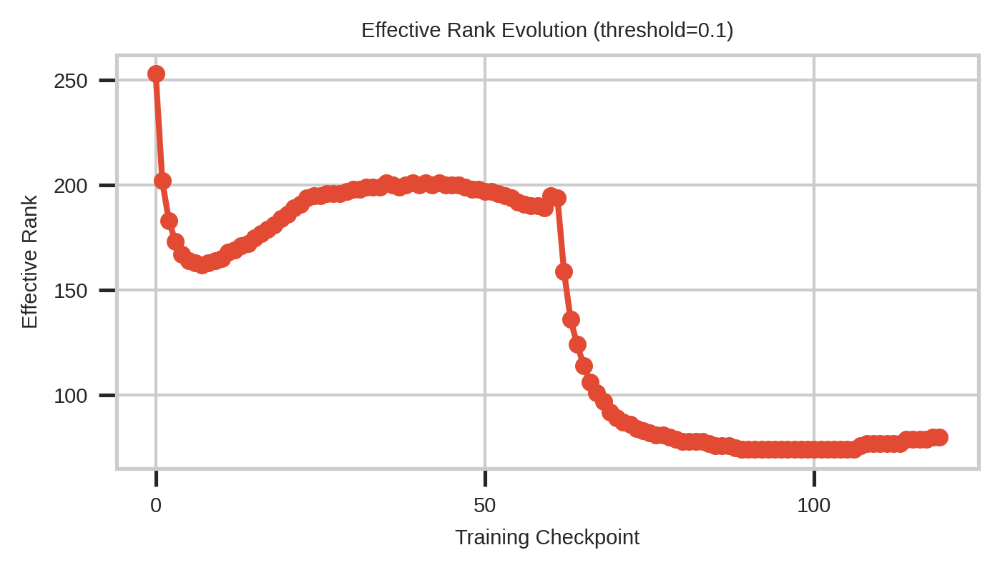

In [ ]:
# 2. SVD Analysis
# analyzer.plot_singular_value_evolution(top_k=10)
# analyzer.plot_singular_value_distributions()
analyzer.plot_effective_rank(threshold=0.1, figsize=(5, 3), fontsize=7)

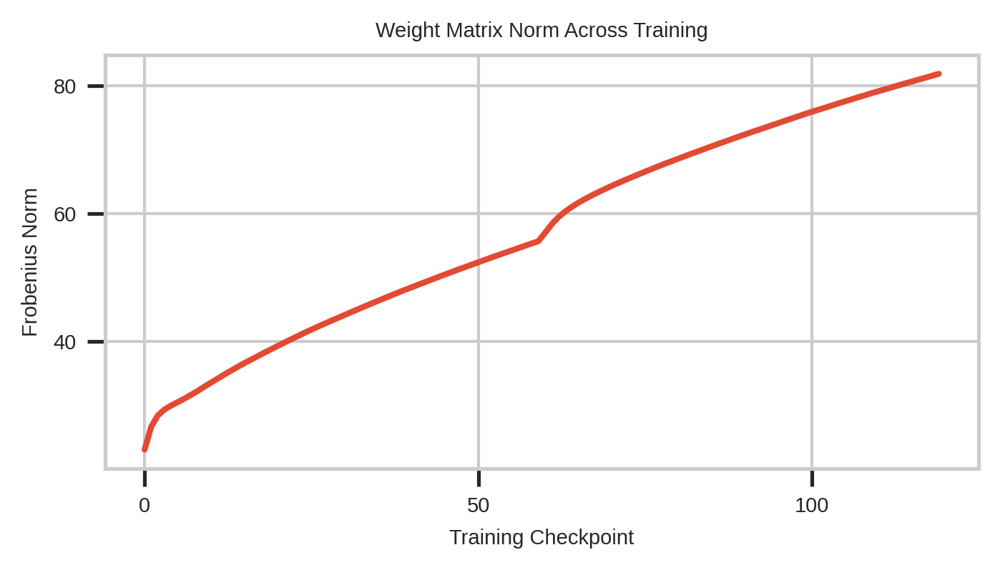

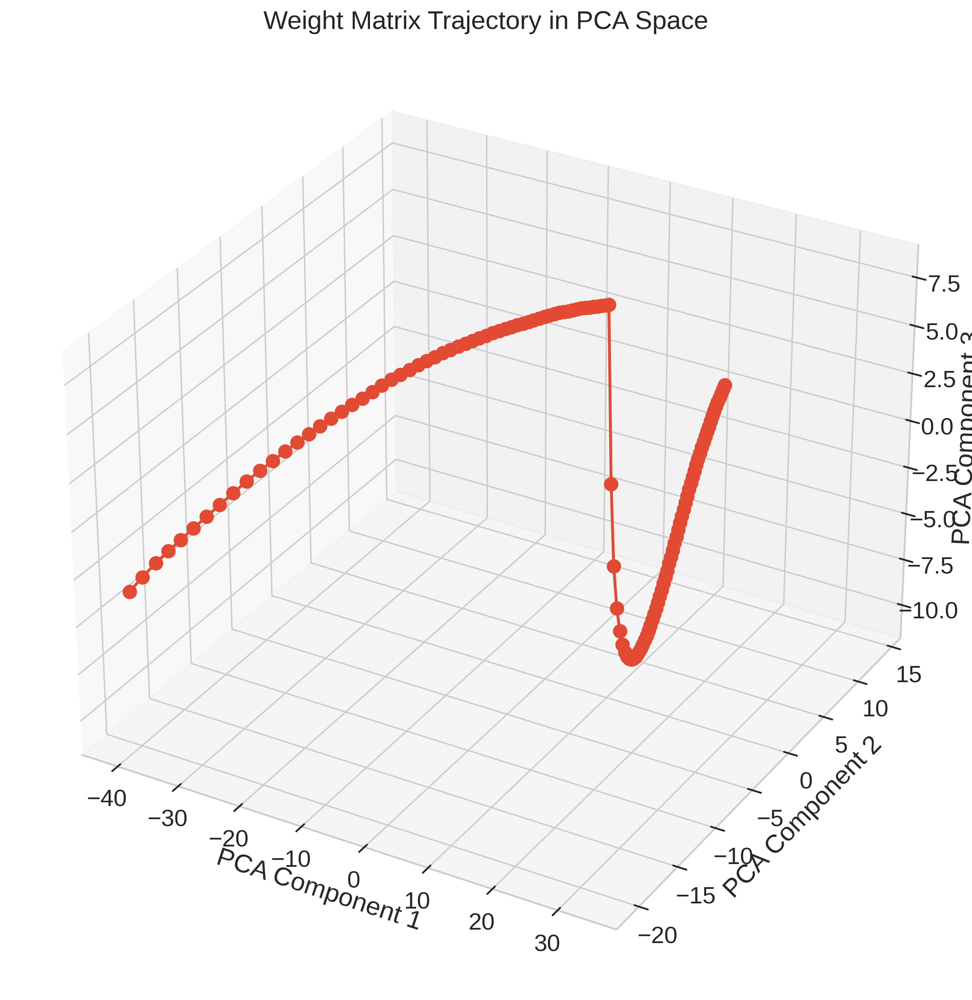

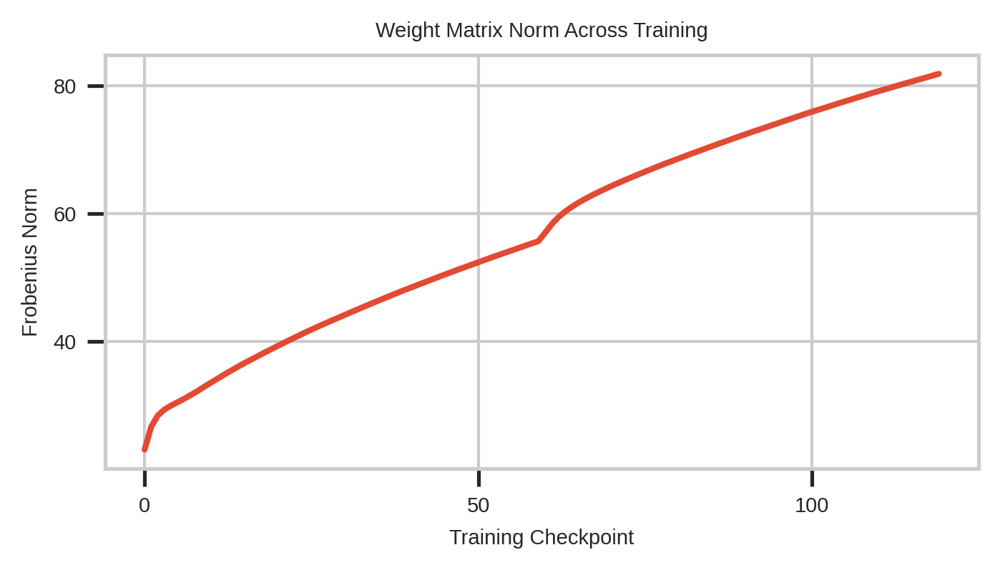

In [ ]:
# 3. Weight Trajectory Analysis
analyzer.plot_weight_change_trajectory(method='pca')
analyzer.plot_weight_norms(figsize=(5, 3))

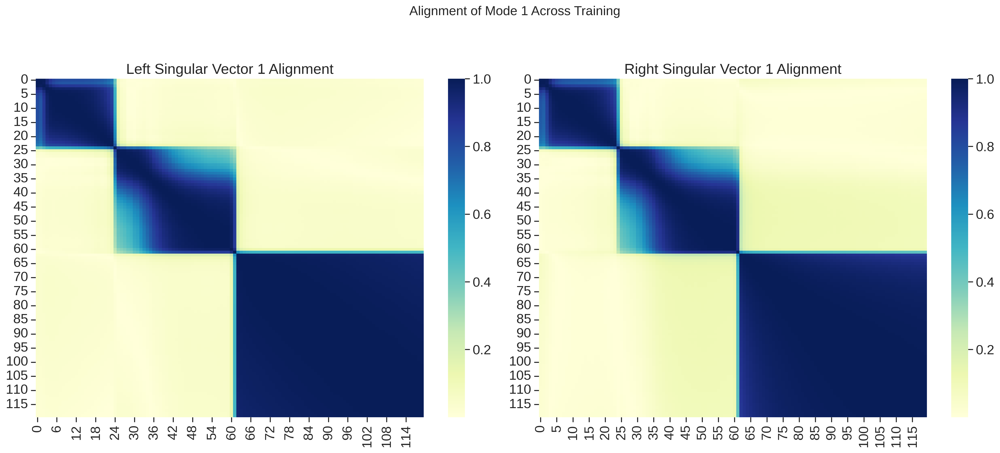

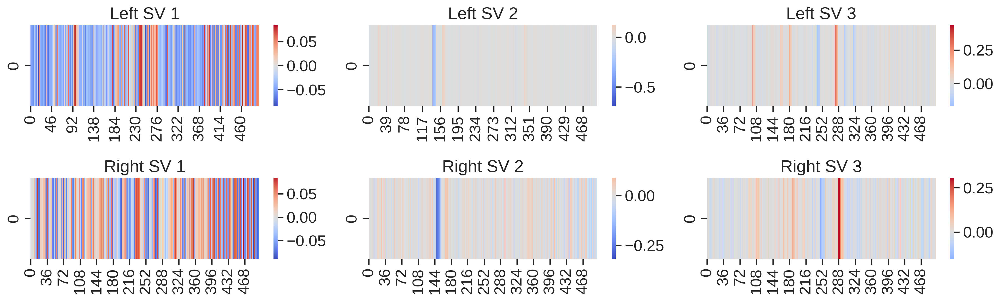

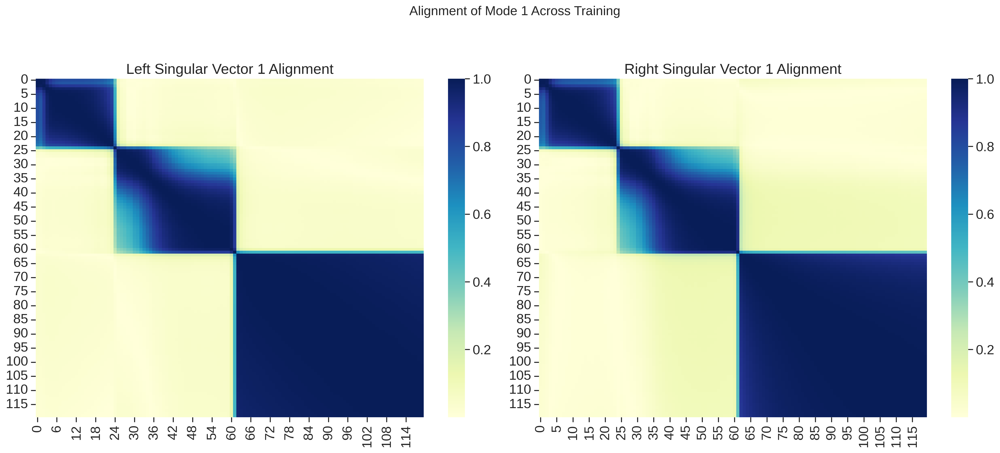

In [ ]:
# 4. Mode Analysis
analyzer.visualize_principal_modes(checkpoint_idx=-1, top_k=3)
analyzer.plot_mode_alignment(mode_idx=0)

In [ ]:
def analyze_temporal_patterns(analyzer, checkpoint_idx, top_k=5, figsize=(15, 12)):
    """
    Analyze temporal patterns in the singular vectors of an RNN weight matrix.

    Args:
        analyzer: RNNWeightAnalyzer object containing SVD results
        checkpoint_idx: Index of checkpoint to analyze
        top_k: Number of top singular vectors to analyze
        figsize: Figure size
    """
    # Get singular vectors for the specified checkpoint
    U, S, Vt = analyzer.svd_results[checkpoint_idx]

    # Create a figure with subplots
    fig, axes = plt.subplots(top_k, 2, figsize=figsize)

    # Reshape weight matrix for reference
    weight_shape = analyzer.weights[checkpoint_idx].shape
    hidden_size = weight_shape[0]  # Assuming square matrix for RNN

    for i in range(top_k):
        # Left singular vector (output direction)
        left_sv = U[:, i]

        # Right singular vector (input direction)
        right_sv = Vt[i, :]

        # Analyze left singular vector (output patterns)
        axes[i, 0].plot(left_sv, '-o', markersize=1, lw=0.5)
        axes[i, 0].set_title(f"Left SV {i+1} (σ={S[i]:.3f})", fontsize=7)
        axes[i, 0].grid(False)
        axes[i, 0].set_yticks(ticks=[-1,0,1],labels=[-1,0,1],fontsize=7)
        axes[i, 0].set_xticks(ticks=[0,250,500],labels=[0,250,500],fontsize=7)
        axes[i, 0].tick_params(axis='x', length=0)
        axes[i, 0].tick_params(axis='y', length=0)
        axes[i, 0].axhline(0, ls='--', lw=0.25, color='k')

        # Find peaks in the vector to identify strongest components
        peaks, _ = find_peaks(np.abs(left_sv), height=0.5*np.max(np.abs(left_sv)))
        axes[i, 0].plot(peaks, left_sv[peaks], 'ro', markersize=1)

        # Analyze right singular vector (input patterns)
        axes[i, 1].plot(right_sv, '-o', markersize=1, lw=0.5)
        axes[i, 1].set_title(f"Right SV {i+1} (σ={S[i]:.3f})", fontsize=7)
        axes[i, 1].grid(False)
        axes[i, 1].set_yticks(ticks=[-1,0,1],labels=[-1,0,1],fontsize=7)
        axes[i, 1].set_xticks(ticks=[0,250,500],labels=[0,250,500],fontsize=7)
        axes[i, 1].tick_params(axis='x', length=0)
        axes[i, 1].tick_params(axis='y', length=0)
        axes[i, 1].axhline(0, ls='--', lw=0.25, color='k')

        # Find peaks in the vector
        peaks, _ = find_peaks(np.abs(right_sv), height=0.5*np.max(np.abs(right_sv)))
        axes[i, 1].plot(peaks, right_sv[peaks], 'ro', markersize=1)

    plt.tight_layout()
    # plt.suptitle(f"Singular Vector Analysis for {analyzer.checkpoint_labels[checkpoint_idx]}", y=1.02, fontsize=7)
    # return fig

def visualize_temporal_structure(analyzer, checkpoint_idx, top_k=3, figsize=(18, 12)):
    """
    Visualize the temporal structure in the weight matrix and its singular vectors.

    Args:
        analyzer: RNNWeightAnalyzer object
        checkpoint_idx: Index of checkpoint to analyze
        top_k: Number of top singular vectors to analyze
        figsize: Figure size
    """
    # Get the weight matrix and SVD results
    W = analyzer.weights[checkpoint_idx]
    U, S, Vt = analyzer.svd_results[checkpoint_idx]

    # Create custom diverging colormap
    cmap = LinearSegmentedColormap.from_list("custom_diverging",
                                            ["#3498db", "#f1f1f1", "#e74c3c"])

    fig, axes = plt.subplots(2, 2, figsize=figsize)

    # Plot the weight matrix
    im0 = axes[0, 0].imshow(W, cmap=cmap, aspect='auto', vmin=-1, vmax=1)
    axes[0, 0].set_title("Weight Matrix")
    axes[0, 0].set_xlabel("Input Index")
    axes[0, 0].set_ylabel("Output Index")
    plt.colorbar(im0, ax=axes[0, 0])

    # Plot the reconstructions using top-k singular values
    W_approx = U[:, :top_k] @ np.diag(S[:top_k]) @ Vt[:top_k, :]
    im1 = axes[0, 1].imshow(W_approx, cmap=cmap, aspect='auto', vmin=-1, vmax=1)
    axes[0, 1].set_title(f"Rank-{top_k} Approximation")
    axes[0, 1].set_xlabel("Input Index")
    axes[0, 1].set_ylabel("Output Index")
    plt.colorbar(im1, ax=axes[0, 1])

    # Plot outer products of top singular vectors
    for k in range(min(top_k, 2)):  # Show at most 2 outer products
        outer_product = np.outer(U[:, k], Vt[k, :])
        im = axes[1, k].imshow(outer_product, cmap=cmap, aspect='auto')
        axes[1, k].set_title(f"Outer Product of Mode {k+1} (σ={S[k]:.3f})")
        axes[1, k].set_xlabel("Input Index")
        axes[1, k].set_ylabel("Output Index")
        plt.colorbar(im, ax=axes[1, k])

    plt.tight_layout()
    plt.suptitle(f"Temporal Structure Analysis for {analyzer.checkpoint_labels[checkpoint_idx]}",
                y=1.02, fontsize=16)
    # return fig

def analyze_temporal_delays(analyzer, checkpoint_idx, max_delay=10, top_k=3):
    """
    Analyze potential temporal delays encoded in the singular vectors.

    Args:
        analyzer: RNNWeightAnalyzer object
        checkpoint_idx: Index of checkpoint to analyze
        max_delay: Maximum delay to check for correlations
        top_k: Number of top singular vectors to analyze
    """
    # Get the singular vectors
    U, S, Vt = analyzer.svd_results[checkpoint_idx]

    # Calculate autocorrelation for top singular vectors
    fig, axes = plt.subplots(top_k, 2, figsize=(15, 4*top_k))

    for i in range(top_k):
        left_sv = U[:, i]
        right_sv = Vt[i, :]

        # Calculate autocorrelation for left singular vector
        autocorr_left = np.zeros(max_delay)
        for d in range(max_delay):
            if d == 0:
                autocorr_left[d] = np.sum(left_sv**2)
            else:
                autocorr_left[d] = np.sum(left_sv[d:] * left_sv[:-d])

        # Normalize
        autocorr_left = autocorr_left / autocorr_left[0]

        # Calculate autocorrelation for right singular vector
        autocorr_right = np.zeros(max_delay)
        for d in range(max_delay):
            if d == 0:
                autocorr_right[d] = np.sum(right_sv**2)
            else:
                autocorr_right[d] = np.sum(right_sv[d:] * right_sv[:-d])

        # Normalize
        autocorr_right = autocorr_right / autocorr_right[0]

        # Plot
        axes[i, 0].bar(range(max_delay), autocorr_left)
        axes[i, 0].set_title(f"Autocorrelation: Left SV {i+1}")
        axes[i, 0].set_xlabel("Delay")
        axes[i, 0].set_ylabel("Correlation")
        axes[i, 0].grid(True)

        axes[i, 1].bar(range(max_delay), autocorr_right)
        axes[i, 1].set_title(f"Autocorrelation: Right SV {i+1}")
        axes[i, 1].set_xlabel("Delay")
        axes[i, 1].set_ylabel("Correlation")
        axes[i, 1].grid(True)

    plt.tight_layout()
    plt.suptitle(f"Temporal Delay Analysis for {analyzer.checkpoint_labels[checkpoint_idx]}",
                y=1.02, fontsize=16)
    # return fig

def compare_temporal_patterns_across_checkpoints(analyzer, mode_idx=0, checkpoints_to_compare=None):
    """
    Compare temporal patterns in a specific mode across different training checkpoints.

    Args:
        analyzer: RNNWeightAnalyzer object
        mode_idx: Index of the mode to analyze
        checkpoints_to_compare: List of checkpoint indices to compare (if None, use all)
    """
    if checkpoints_to_compare is None:
        checkpoints_to_compare = list(range(len(analyzer.checkpoint_labels)))

    n_checkpoints = len(checkpoints_to_compare)

    # Create figure
    fig, axes = plt.subplots(2, 1, figsize=(12, 8))

    for i, cp_idx in enumerate(checkpoints_to_compare):
        # Get singular vectors for this checkpoint
        U, S, Vt = analyzer.svd_results[cp_idx]

        # Plot left singular vector
        axes[0].plot(U[:, mode_idx],
                    label=f"{analyzer.checkpoint_labels[cp_idx]} (σ={S[mode_idx]:.3f})")

        # Plot right singular vector
        axes[1].plot(Vt[mode_idx, :],
                    label=f"{analyzer.checkpoint_labels[cp_idx]} (σ={S[mode_idx]:.3f})")

    axes[0].set_title(f"Left Singular Vector Evolution (Mode {mode_idx+1})")
    axes[0].legend()
    axes[0].grid(True)

    axes[1].set_title(f"Right Singular Vector Evolution (Mode {mode_idx+1})")
    axes[1].legend()
    axes[1].grid(True)

    plt.tight_layout()
    # return fig

def visualize_frequency_response(analyzer, checkpoint_idx, top_k=3, figsize=(15, 10)):
    """
    Visualize the frequency response of top singular vectors using FFT.
    This helps identify if the singular vectors encode specific frequencies.

    Args:
        analyzer: RNNWeightAnalyzer object
        checkpoint_idx: Index of checkpoint to analyze
        top_k: Number of top singular vectors to analyze
        figsize: Figure size
    """
    # Get singular vectors
    U, S, Vt = analyzer.svd_results[checkpoint_idx]

    fig, axes = plt.subplots(top_k, 2, figsize=figsize)

    for i in range(top_k):
        # Left singular vector
        left_sv = U[:, i]
        left_fft = np.abs(np.fft.rfft(left_sv))
        left_freq = np.fft.rfftfreq(len(left_sv))

        # Right singular vector
        right_sv = Vt[i, :]
        right_fft = np.abs(np.fft.rfft(right_sv))
        right_freq = np.fft.rfftfreq(len(right_sv))

        # Plot left FFT
        axes[i, 0].plot(left_freq, left_fft)
        axes[i, 0].set_title(f"Frequency Response: Left SV {i+1}")
        axes[i, 0].set_xlabel("Frequency")
        axes[i, 0].set_ylabel("Magnitude")
        axes[i, 0].grid(True)

        # Plot right FFT
        axes[i, 1].plot(right_freq, right_fft)
        axes[i, 1].set_title(f"Frequency Response: Right SV {i+1}")
        axes[i, 1].set_xlabel("Frequency")
        axes[i, 1].set_ylabel("Magnitude")
        axes[i, 1].grid(True)

    plt.tight_layout()
    plt.suptitle(f"Frequency Analysis for {analyzer.checkpoint_labels[checkpoint_idx]}",
                y=1.02, fontsize=16)
    # return fig


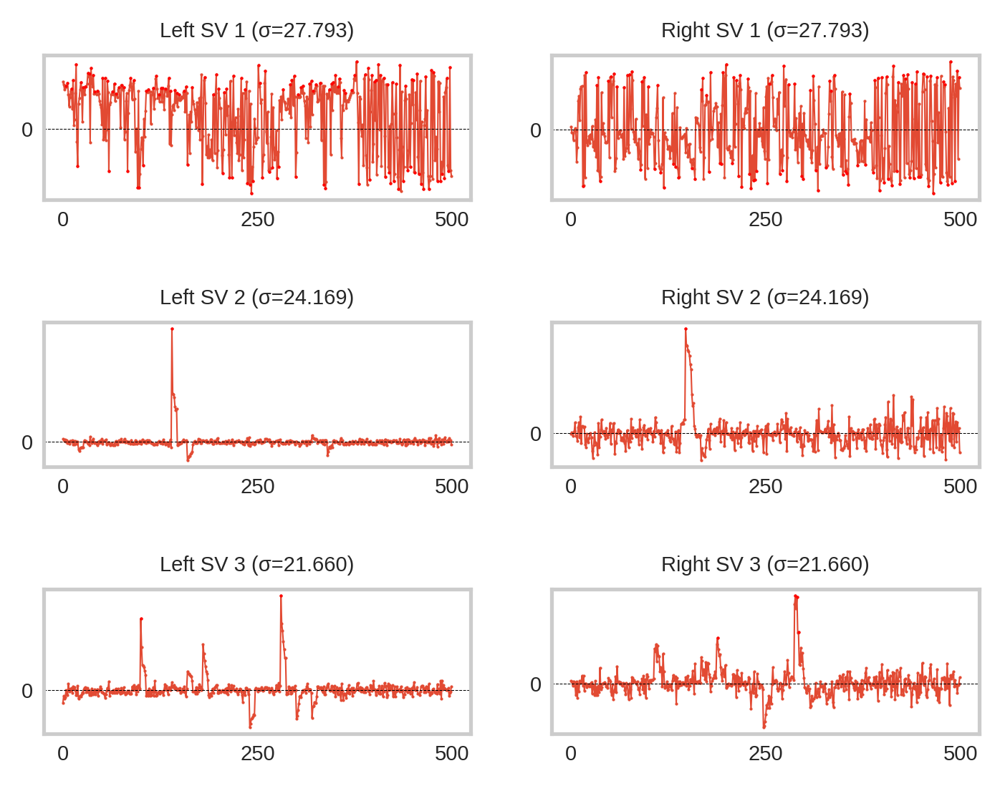

In [ ]:
# For two different checkpoints, such as before and after task switch:
#
# # Before task switch
analyze_temporal_patterns(analyzer, checkpoint_idx=110, top_k=3, figsize=(5, 4))
# visualize_temporal_structure(analyzer, checkpoint_idx=45)
# analyze_temporal_delays(analyzer, checkpoint_idx=45)
# visualize_frequency_response(analyzer, checkpoint_idx=45)

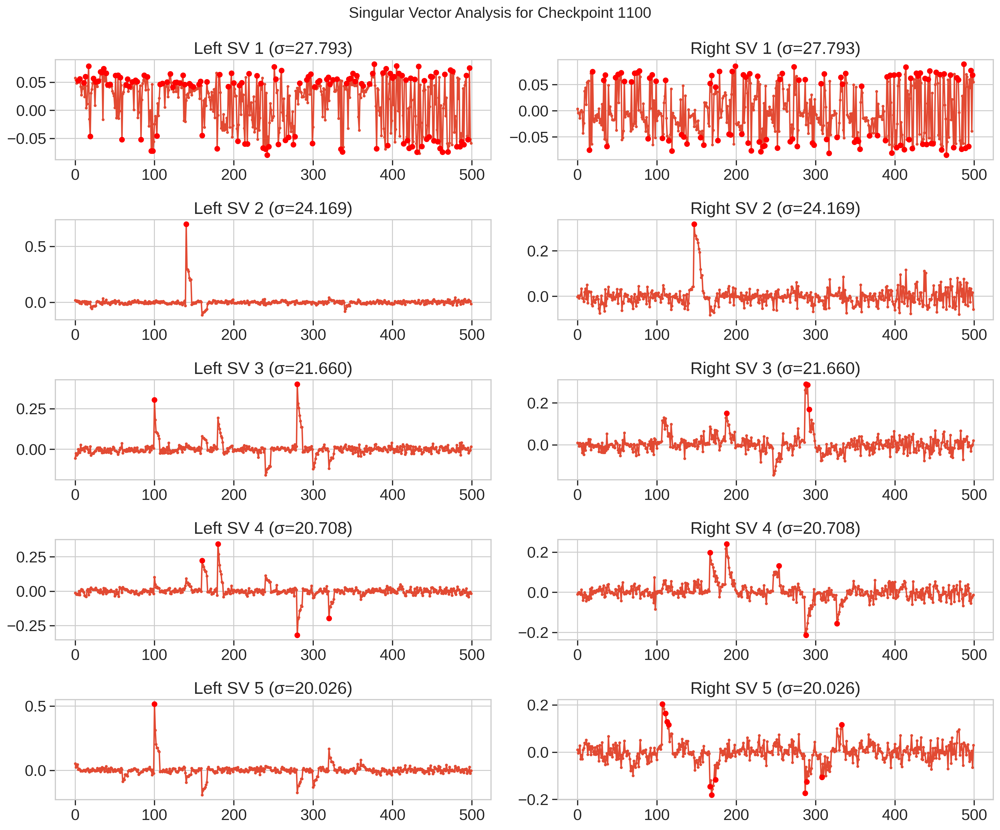

In [ ]:
# # After task switch
analyze_temporal_patterns(analyzer, checkpoint_idx=110)


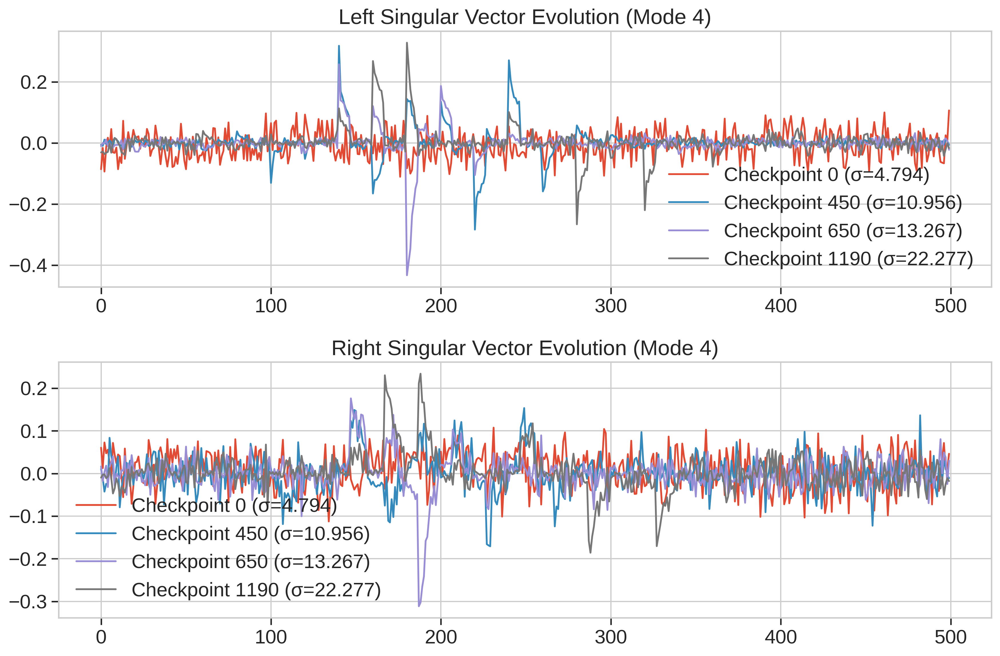

In [ ]:
# # Compare same mode across checkpoints
compare_temporal_patterns_across_checkpoints(analyzer, mode_idx=3,
    checkpoints_to_compare=[0, 45, 65, -1])

#more robust representation that doesn't depend on particular neurons

# Extra training effects[link text]

In [ ]:
sub_inps = [[19], [19,5], [0,5], [0,5], [0,15]]

In [ ]:
## Make the test input
test_input = np.zeros((len(sub_inps), Nt, num_inputs))
for tr in range(len(sub_inps)):
    T0 = 200
    iT0 = int(T0/dta)
    for pat in sub_inps[tr]:
        test_input[tr,iT0:(iT0+I_length_int),pat] = 1.
        iT0 = iT0+I_length_int

In [ ]:
Test_input = torch.from_numpy(test_input).type(dtype).to('cuda')

Output_test = Net_temp.forward(Test_input)
output_test = Output_test.cpu().detach().numpy()

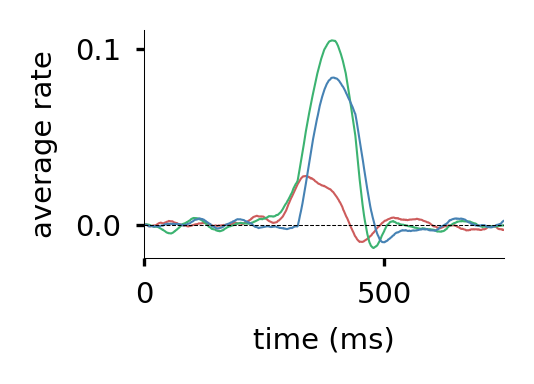

In [ ]:
# =============================================================================
#   Plot results
# =============================================================================

# Plot input stimulus structure
iTr = 1 # sample index
#fig = plt.figure()
fig = plt.figure(figsize=[2, 1.5])
ax1 = plt.gca()
for axis in ['bottom','left']:
    ax1.spines[axis].set_linewidth(0.25)
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)

x1 = np.linspace(0, 1000, num=1000)

Colors = ['indianred', 'coral', 'darkorange', 'orange', 'gold', 'yellow', 'greenyellow', 'lawngreen', 'limegreen',
          'mediumseagreen', 'mediumaquamarine', 'mediumturquoise', 'lightseagreen', 'teal', 'steelblue',
          'royalblue', 'slateblue', 'darkslateblue', 'rebeccapurple', 'indigo']

# for i in range(n_stim):
#   plt.plot(x1[:], (output_test[0,:,np.where(wi_init[5]>0)[0][i]]).T, color=Colors[10],lw=0.5,alpha=0.5)
#   plt.plot(x1[:], (output_test[1,:,np.where(wi_init[5]>0)[0][i]]).T, color=Colors[15],lw=0.5,alpha=0.5)
  # plt.plot(x1[:], (output_test[2,:,np.where(wi_init[5]>0)[0][i]]).T, color=Colors[14],lw=0.5,alpha=0.5)
  # plt.plot(x1[:], (output_test[3,:,np.where(wi_init[6]>0)[0][i]]).T, color=Colors[i],lw=0.5)

plt.plot(x1[:], (output_test[0,:,np.where(wi_init[5]>0)[0]]).T.mean(axis=1), color=Colors[0],lw=0.5, alpha=1)
plt.plot(x1[:], (output_test[1,:,np.where(wi_init[5]>0)[0]]).T.mean(axis=1), color=Colors[9],lw=0.5, alpha=1)
plt.plot(x1[:], (output_test[2,:,np.where(wi_init[5]>0)[0]]).T.mean(axis=1), color=Colors[14],lw=0.5)
# plt.plot(x1[:], (output_test[2,:,np.where(wi_init[15]>0)[0]]).T.mean(axis=1), color=Colors[9],lw=0.5)
# plt.plot(x1[:], (output_test[3,:,np.where(wi_init[5]>0)[0]]).T.mean(axis=1), color=Colors[0],lw=0.5, ls='--', alpha=0.75)
# plt.plot(x1[:], (output_test[4,:,np.where(wi_init[15]>0)[0]]).T.mean(axis=1), color=Colors[9],lw=0.5, ls='--', alpha=0.75)

plt.xlabel('time (ms)', fontsize=7)
plt.ylabel('average rate', fontsize=7)
# plt.ylim(-0.05,0.2)
plt.xlim(0,750)
plt.axhline(0, ls='--', lw=0.25, color='k')
plt.xticks(fontsize=7)
plt.yticks(fontsize=7)
plt.savefig(figs_dir/'prior_stim_effect_third_training_19_5.pdf')
plt.show()

# Read in the Data



In [ ]:
Net_temp = mm.RNN(num_inputs, hidden_size, output_size, Wi_init, Wo_init, Wrec_init, alpha=alpha)

In [ ]:
epoch_num = 600
checkpoint_path = f'/content/drive/My Drive/Colab Notebooks/first_training/checkpoint_epoch_{epoch_num}.pth'
checkpoint = load_checkpoint(checkpoint_path, Net_temp)

# # Now you can access:
weights = checkpoint['model_state_dict']     # Get the weights
Wrec_temp = weights['wrec']

Net_temp = mm.RNN(num_inputs, hidden_size, output_size, Wi_init, Wo_init, Wrec_temp, alpha=alpha)

In [ ]:
# Sequence Training Protocol
natural= np.arange(0, num_inputs)
natural_seqs = np.array([[0,1,2,3,4], [5,6,7,8,9], [10,11,12,13,14], [15,16,17,18,19]])
unnatural_seqs = np.array([[4,1,0,3,2], [7,9,6,8,5], [10,14,11,13,12], [16,18,17,15,19]])

sub_inps_nat = natural_seqs
sub_inps_unnat = unnatural_seqs

In [ ]:
# Sequence Training Protocol
natural= np.arange(0, num_inputs)
natural_seqs = create_sequences(natural, num_inputs)
unnatural = np.array([11,  4, 15,  8, 16,  7, 18,  0, 14,  9, 19,  5, 13, 12,  3,  6,  1, 2, 10, 17])
unnatural_seqs = create_sequences(unnatural, num_inputs)

sub_inps_nat = [[0],[1],[2],[3],[4],[5],[6],[7],[8],[9],[10],[11],[12],[13],[14],[15],[16],[17],[18],[19]]
# sub_inps_unnat = unnatural_seqs

In [ ]:
## Make the test input
test_input = np.zeros((len(sub_inps_nat), Nt, num_inputs))
for tr in range(len(sub_inps_nat)):
    T0 = 200
    iT0 = int(T0/dta)
    for pat in sub_inps_nat[tr]:
        test_input[tr,iT0:(iT0+I_length_int),pat] = 1.
        iT0 = iT0+I_length_int

In [ ]:
Test_input = torch.from_numpy(test_input).type(dtype).to('cpu')

Output_test = Net_temp.forward(Test_input)
natural_output = Output_test.cpu().detach().numpy()

In [ ]:
np.save(figs_dir/'first_training_singles.npy', natural_output)

In [ ]:
trained_activity = natural_output.reshape(-1, 500)[:,:400]

In [ ]:
## Make the test input
test_input = np.zeros((len(sub_inps_unnat), Nt, num_inputs))
for tr in range(len(sub_inps_unnat)):
    T0 = 200
    iT0 = int(T0/dta)
    for pat in sub_inps_unnat[tr]:
        test_input[tr,iT0:(iT0+I_length_int),pat] = 1.
        iT0 = iT0+I_length_int

In [ ]:
Test_input = torch.from_numpy(test_input).type(dtype).to('cpu')

Output_test = Net_temp.forward(Test_input)
unnatural_output = Output_test.cpu().detach().numpy()

In [ ]:
untrained_activity = unnatural_output.reshape(-1, 500)[:,:400]

In [ ]:
trained_pattern_times_list = []
for i in range(len(natural_seqs)):
  timestamps = np.array(iT0s[:5])+(i*1000)
  trained_pattern_times_list.append(timestamps)

In [ ]:
pattern_times = np.concatenate(trained_pattern_times_list)

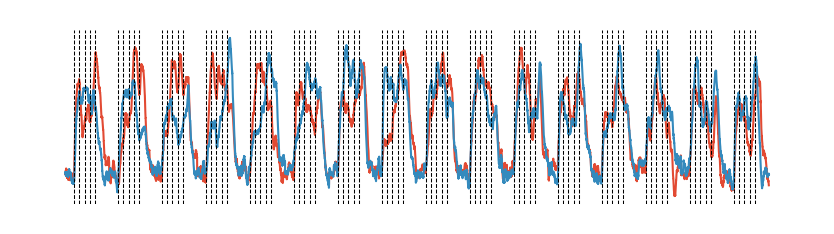

In [ ]:
fig, ax = plt.subplots(figsize=(3,1))
plt.plot(trained_activity.mean(axis=1), lw=0.5)
plt.plot(untrained_activity.mean(axis=1), lw=0.5)
ax.axis('off')
for x in pattern_times:
  plt.axvline(x, lw=0.25, ls='--', color='k')
# plt.axvline(120, lw=0.25, ls='--', color='k')

In [ ]:
np.save(figs_dir/'third_trained_activity.npy', trained_activity)
np.save(figs_dir/'third_untrained_activity.npy', untrained_activity)

In [ ]:
first_trained = np.load(figs_dir/'first_trained_activity.npy')
first_untrained = np.load(figs_dir/'first_untrained_activity.npy')
second_trained = np.load(figs_dir/'second_trained_activity.npy')
second_untrained = np.load(figs_dir/'second_untrained_activity.npy')
third_trained = np.load(figs_dir/'third_trained_activity.npy')
third_untrained = np.load(figs_dir/'third_untrained_activity.npy')

# Response Timing Analysis

In [ ]:
def create_sliding_heatmap(trained_activity):
    # Calculate the maximum possible start index
    max_start = len(trained_activity) - 10  # Since we need 10 timepoints total (5 for each interval)

    # Create the slider widget
    start_idx = widgets.IntSlider(
        value=200,
        min=0,
        max=max_start,
        step=1,
        description='Start Index:',
        continuous_update=False,
        style={'description_width': 'initial'}
    )

    def update_plot(start):
        # Clear the previous plot
        plt.clf()

        # Calculate the difference between the two 5-timepoint intervals
        difference = trained_activity[start:start+5, :120]

        s = calc_sparsity(difference.mean(axis=0))

        # Create the heatmap
        plt.figure(figsize=(8, 2))
        sns.heatmap(difference, vmin=-0.1, vmax=0.1, cmap='RdBu_r')
        # plt.title(f'Activity Difference (t={start}:{start+5} minus t={start+5}:{start+10})')
        plt.xlabel('Neurons')
        plt.ylabel('Time')
        plt.title(f'Sparsity: {s}', fontsize=7)
        plt.show()

    def calc_sparsity(resps):
        # resps = resps-np.min(resps)
        frac1 = 1/resps.shape[0]
        frac2 = (np.sum(resps)**2)/np.sum(resps**2)
        s = (1-(frac1*frac2))/(1-frac1)
        return s

    # Create the interactive widget
    interactive_plot = widgets.interactive(update_plot, start=start_idx)

    # Display the widget
    display(interactive_plot)

# Example usage:
create_sliding_heatmap(trained_activity)

interactive(children=(IntSlider(value=200, continuous_update=False, description='Start Index:', max=3990, styl…

In [ ]:
create_sliding_heatmap(untrained_activity)

interactive(children=(IntSlider(value=200, continuous_update=False, description='Start Index:', max=3990, styl…

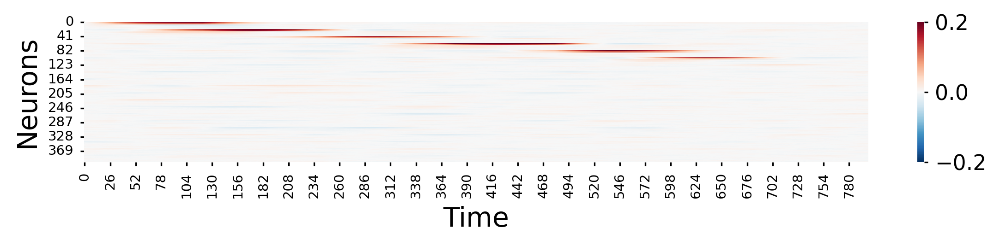

In [ ]:
plt.figure(figsize=(8, 2))
sns.heatmap((first_trained[200:1000]).T, vmin=-0.2, vmax=0.2, cmap='RdBu_r')
plt.xlabel('Time')
plt.ylabel('Neurons')
plt.yticks(fontsize=7)
plt.xticks(fontsize=7)
# plt.savefig(figs_dir/'third_trained_activity_heatmap.pdf')
plt.show()

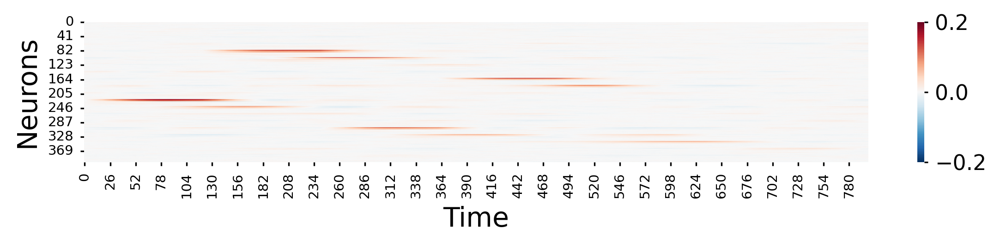

In [ ]:
plt.figure(figsize=(8, 2))
sns.heatmap((first_untrained[200:1000]).T, vmin=-0.2, vmax=0.2, cmap='RdBu_r')
plt.xlabel('Time')
plt.ylabel('Neurons')
plt.yticks(fontsize=7)
plt.xticks(fontsize=7)
# plt.savefig(figs_dir/'third_untrained_activity_heatmap.pdf')
plt.show()

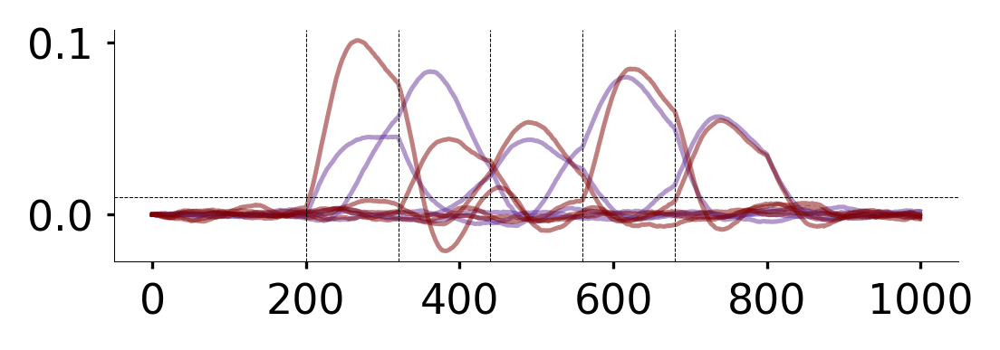

In [ ]:
fig = plt.figure(figsize=[4, 1.5])
ax1 = plt.gca()
for axis in ['bottom','left']:
    ax1.spines[axis].set_linewidth(0.25)
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)

# First Trained
plt.plot(first_trained[:1000, np.where(wi_init[0]>0)[0]].T.mean(axis=0), color='rebeccapurple', alpha=0.5)
plt.plot(first_trained[:1000, np.where(wi_init[1]>0)[0]].T.mean(axis=0), color='rebeccapurple', alpha=0.5)
plt.plot(first_trained[:1000, np.where(wi_init[2]>0)[0]].T.mean(axis=0), color='rebeccapurple', alpha=0.5)
plt.plot(first_trained[:1000, np.where(wi_init[3]>0)[0]].T.mean(axis=0), color='rebeccapurple', alpha=0.5)
plt.plot(first_trained[:1000, np.where(wi_init[4]>0)[0]].T.mean(axis=0), color='rebeccapurple', alpha=0.5)

# Second Trained
plt.plot(second_trained[:1000, np.where(wi_init[0]>0)[0]].T.mean(axis=0), color='maroon', alpha=0.5)
plt.plot(second_trained[:1000, np.where(wi_init[1]>0)[0]].T.mean(axis=0), color='maroon', alpha=0.5)
plt.plot(second_trained[:1000, np.where(wi_init[2]>0)[0]].T.mean(axis=0), color='maroon', alpha=0.5)
plt.plot(second_trained[:1000, np.where(wi_init[3]>0)[0]].T.mean(axis=0), color='maroon', alpha=0.5)
plt.plot(second_trained[:1000, np.where(wi_init[4]>0)[0]].T.mean(axis=0), color='maroon', alpha=0.5)

# First Untrained
# plt.plot(first_untrained[:1000, np.where(wi_init[11]>0)[0]].T.mean(axis=0), color='darkcyan', alpha=0.5)
# plt.plot(first_untrained[:1000, np.where(wi_init[4]>0)[0]].T.mean(axis=0), color='darkcyan', alpha=0.5)
# plt.plot(first_untrained[:1000, np.where(wi_init[15]>0)[0]].T.mean(axis=0), color='darkcyan', alpha=0.5)
# plt.plot(first_untrained[:1000, np.where(wi_init[8]>0)[0]].T.mean(axis=0), color='darkcyan', alpha=0.5)
# plt.plot(first_untrained[:1000, np.where(wi_init[16]>0)[0]].T.mean(axis=0), color='darkcyan', alpha=0.5)

# Second Untrained
# plt.plot(second_untrained[:1000, np.where(wi_init[11]>0)[0]].T.mean(axis=0), color='orangered', alpha=0.5)
# plt.plot(second_untrained[:1000, np.where(wi_init[4]>0)[0]].T.mean(axis=0), color='orangered', alpha=0.5)
# plt.plot(second_untrained[:1000, np.where(wi_init[15]>0)[0]].T.mean(axis=0), color='orangered', alpha=0.5)
# plt.plot(second_untrained[:1000, np.where(wi_init[8]>0)[0]].T.mean(axis=0), color='orangered', alpha=0.5)
# plt.plot(second_untrained[:1000, np.where(wi_init[16]>0)[0]].T.mean(axis=0), color='orangered', alpha=0.5)

# Third Untrained
# plt.plot(third_untrained[:1000, np.where(wi_init[11]>0)[0]].T.mean(axis=0), color='olivedrab', alpha=0.5)
# plt.plot(third_untrained[:1000, np.where(wi_init[4]>0)[0]].T.mean(axis=0), color='olivedrab', alpha=0.5)
# plt.plot(third_untrained[:1000, np.where(wi_init[15]>0)[0]].T.mean(axis=0), color='olivedrab', alpha=0.5)
# plt.plot(third_untrained[:1000, np.where(wi_init[8]>0)[0]].T.mean(axis=0), color='olivedrab', alpha=0.5)
# plt.plot(third_untrained[:1000, np.where(wi_init[16]>0)[0]].T.mean(axis=0), color='olivedrab', alpha=0.5)

for x in pattern_times[:5]:
  plt.axvline(x, lw=0.25, ls='--', color='k')

plt.axhline(0.01, lw=0.25, ls='--', color='k')

plt.show()

### FWHM

In [ ]:
# For every pattern in pat of pats - run this analysis and save it to the same list
# will need to shift the timing frames for each new set of patterns which is every 1000 frames

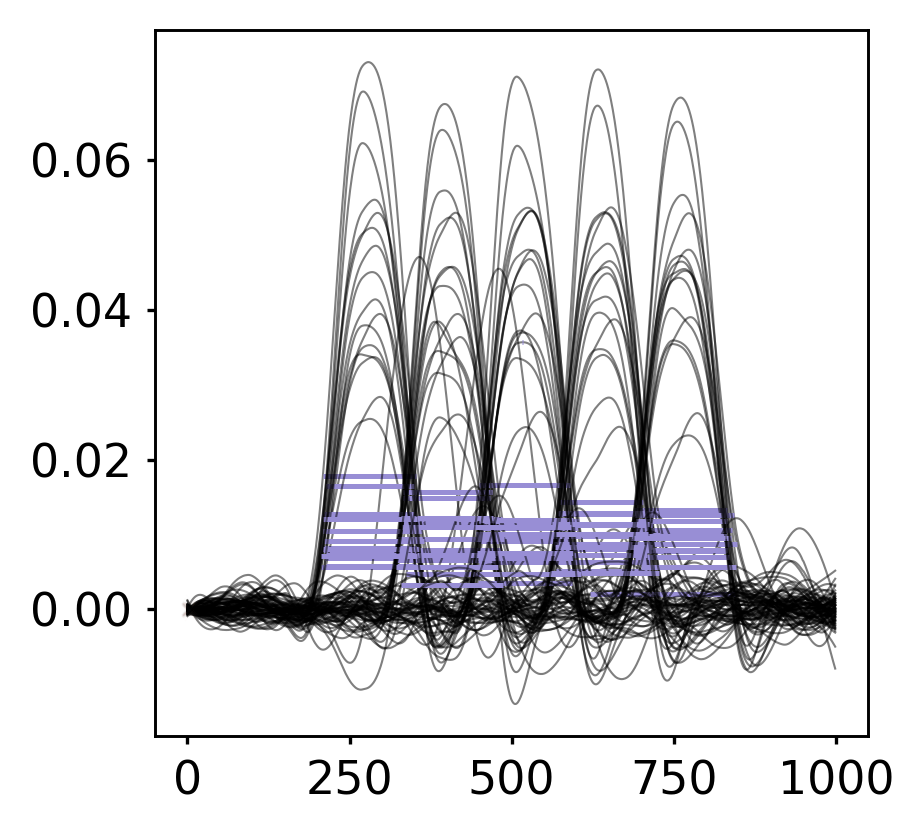

In [ ]:
pat_half = []
for seq_num, sequence in enumerate(natural_seqs):
  for x, pattern in enumerate(sequence):
    meanamp = third_trained[seq_num*1000:seq_num*1000+1000, np.where(wi_init[pattern]>0)[0]].T.mean(axis=0)
    smoothed_data = savgol_filter(meanamp, window_length=100, polyorder=3)
    peaks, properties = find_peaks(smoothed_data, height=0)
    peak = np.where((pattern_times[x]+120 > peaks) & (peaks > pattern_times[x]))[0]
    results_half = peak_widths(smoothed_data, peaks[peak], rel_height=0.75)

    plt.plot(smoothed_data, color='k', lw=0.5, alpha=0.5)
    plt.plot(peak, meanamp[peak], "x")
    plt.hlines(*results_half[1:], color="C2")
    pat_half.append(results_half[0].max())

In [ ]:
np.save(figs_dir/'third_pat_half.npy', pat_half)

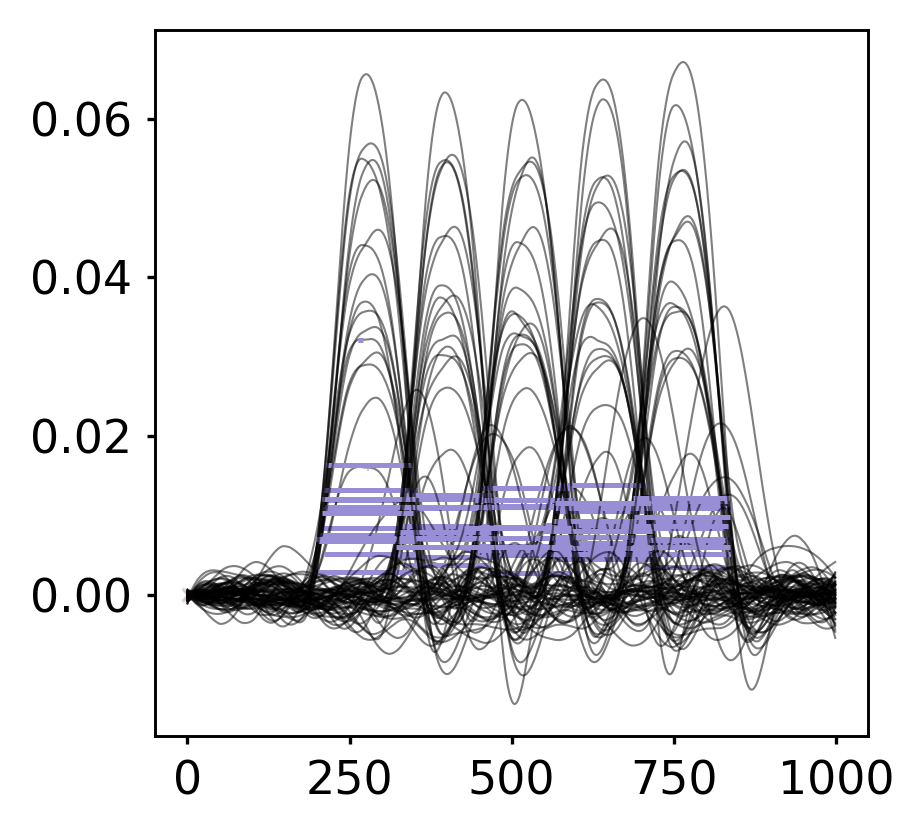

In [ ]:
pat_half = []
for seq_num, sequence in enumerate(unnatural_seqs):
  for x, pattern in enumerate(sequence):
    meanamp = first_untrained[seq_num*1000:seq_num*1000+1000, np.where(wi_init[pattern]>0)[0]].T.mean(axis=0)
    smoothed_data = savgol_filter(meanamp, window_length=100, polyorder=3)
    peaks, properties = find_peaks(smoothed_data, height=0)
    peak = np.where((pattern_times[x]+120 > peaks) & (peaks > pattern_times[x]))[0]
    results_half = peak_widths(smoothed_data, peaks[peak], rel_height=0.75)

    plt.plot(smoothed_data, color='k', lw=0.5, alpha=0.5)
    plt.plot(peak, meanamp[peak], "x")
    plt.hlines(*results_half[1:], color="C2")
    pat_half.append(results_half[0].max())

In [ ]:
np.save(figs_dir/'first_pat_half_un.npy', pat_half)

### Response Onset

In [ ]:
np.save(figs_dir/'pattern_ids.npy', wi_init)

In [ ]:
threshold = 0.01
# pats = [0,1,2,3,4]
pats = [11,4,15,8,16]

onsets = []
for seq_num, sequence in enumerate(unnatural_seqs):
  for x, pattern in enumerate(sequence[1:]):
    meanamp = third_untrained[seq_num*1000:seq_num*1000+1000, np.where(wi_init[pattern]>0)[0]].T.mean(axis=0)
    onset_indices = np.where(meanamp > threshold)[0]
    if len(onset_indices) > 0:
        onset_sample = onset_indices[0]
        onsets.append(onset_sample-pattern_times[x+1])

In [ ]:
np.save(figs_dir/'third_onsets_un.npy', onsets)

### Plotting

In [ ]:
first_pat_half = np.concatenate(np.load(figs_dir/'first_pat_half.npy')).tolist()
first_pat_half_un = np.concatenate(np.load(figs_dir/'first_pat_half_un.npy')).tolist()
second_pat_half = np.concatenate(np.load(figs_dir/'second_pat_half.npy')).tolist()
second_pat_half_un = np.concatenate(np.load(figs_dir/'second_pat_half_un.npy')).tolist()
third_pat_half = np.concatenate(np.load(figs_dir/'third_pat_half.npy')).tolist()
third_pat_half_un = np.concatenate(np.load(figs_dir/'third_pat_half_un.npy')).tolist()

In [ ]:
first_pat_half = np.load(figs_dir/'first_pat_half.npy')
first_pat_half_un = np.load(figs_dir/'first_pat_half_un.npy')
second_pat_half = np.load(figs_dir/'second_pat_half.npy')
second_pat_half_un = np.load(figs_dir/'second_pat_half_un.npy')
third_pat_half = np.load(figs_dir/'third_pat_half.npy')
third_pat_half_un = np.load(figs_dir/'third_pat_half_un.npy')

In [ ]:
xs = list(itertools.chain(*[[1]*len(first_pat_half[:]), [2]*len(first_pat_half_un[:]), [3]*len(second_pat_half[:]), [4]*len(second_pat_half_un[:]), [5]*len(third_pat_half[:]), [6]*len(third_pat_half_un[:])]))
resps = list(itertools.chain(*[first_pat_half[:], first_pat_half_un[:], second_pat_half[:], second_pat_half_un[:], third_pat_half[:], third_pat_half_un[:]]))

In [ ]:
second_pat_half_un = np.delete(second_pat_half_un, np.where(second_pat_half_un>200))


Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.stripplot(x=xs, y=resps, size = 5, jitter = 0.25, alpha=0.5, palette=pal)



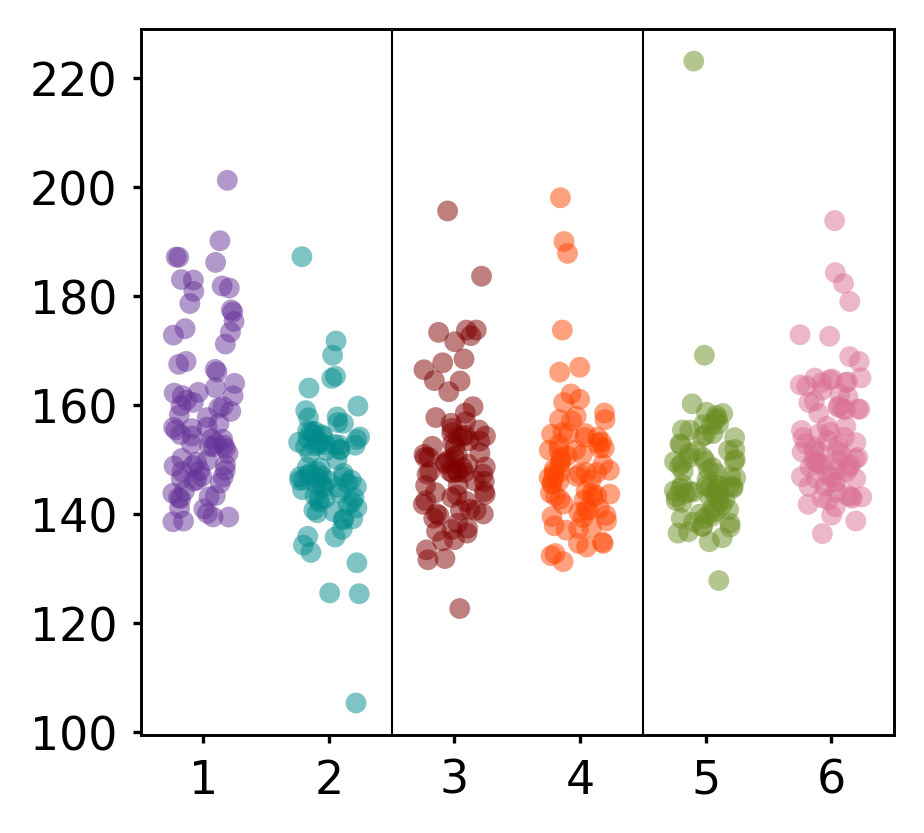

In [ ]:
f, ax = plt.subplots(figsize=(1.6, 1.6))
pal = sns.color_palette(['rebeccapurple', 'darkcyan', 'maroon', 'orangered', 'olivedrab', 'palevioletred'],n_colors=6)
ax=pt.half_violinplot( xs, resps, bw = .5, cut = 0.,
    scale = "area", width = .6, inner = None, alpha=0.6, palette = pal)
ax=sns.stripplot(x=xs, y=resps, size = 5, jitter = 0.25, alpha=0.5, palette=pal)

plt.axvline(1.5, color='k', lw=0.5)
plt.axvline(3.5, color='k', lw=0.5)

In [ ]:
first_onsets = np.load(figs_dir/'first_onsets.npy')
first_onsets_un = np.load(figs_dir/'first_onsets_un.npy')
second_onsets = np.load(figs_dir/'second_onsets.npy')
second_onsets_un = np.load(figs_dir/'second_onsets_un.npy')
third_onsets = np.load(figs_dir/'third_onsets.npy')
third_onsets_un = np.load(figs_dir/'third_onsets_un.npy')

In [ ]:
xs = list(itertools.chain(*[[1]*len(first_onsets[1:]), [2]*len(first_onsets_un[1:-1]), [3]*len(second_onsets[1:]), [4]*len(second_onsets_un[1:-1]), [5]*len(third_onsets[1:]), [6]*len(third_onsets_un[1:])]))
resps = list(itertools.chain(*[first_onsets[1:], first_onsets_un[1:-1], second_onsets[1:], second_onsets_un[1:-1], third_onsets[1:], third_onsets_un[1:]]))


Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.stripplot(x=xs, y=resps, size = 5, jitter = 0.25, alpha=0.5, palette=pal)



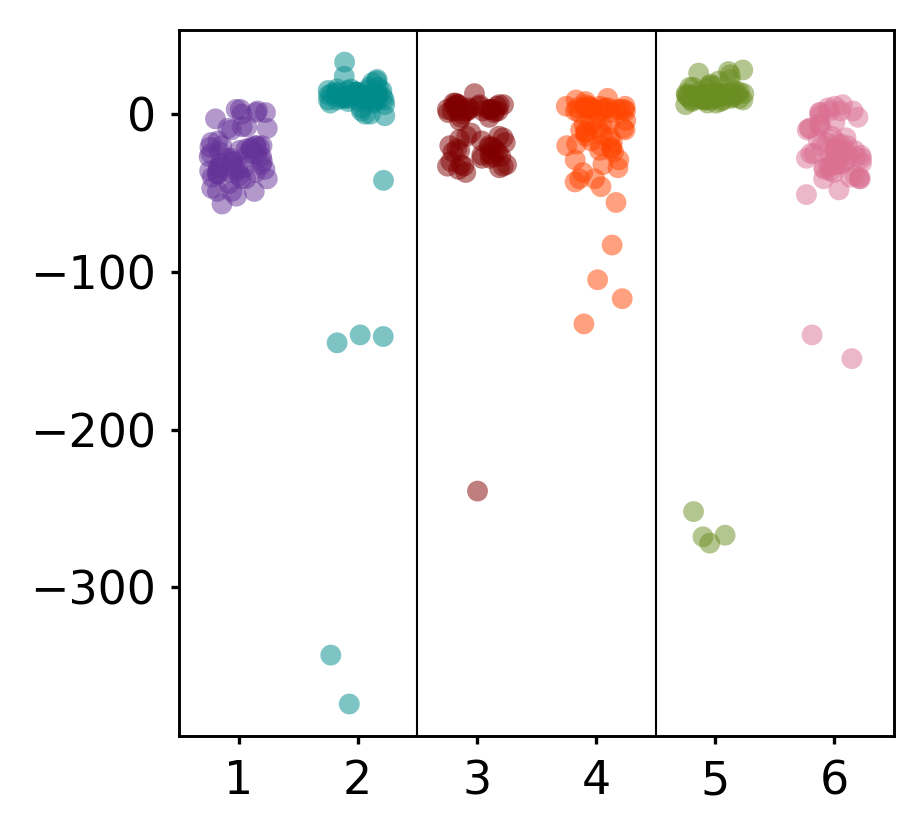

In [ ]:
pal = sns.color_palette(['rebeccapurple', 'darkcyan', 'maroon', 'orangered', 'olivedrab', 'palevioletred'],n_colors=6)
sns.stripplot(x=xs, y=resps, size = 5, jitter = 0.25, alpha=0.5, palette=pal)

plt.axvline(1.5, color='k', lw=0.5)
plt.axvline(3.5, color='k', lw=0.5)

# Only input subsets of patterns

In [ ]:
num_epochs=600

10


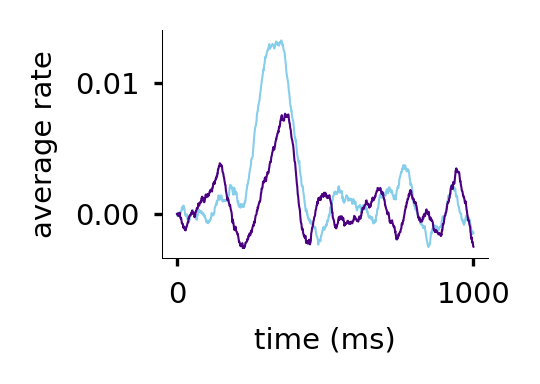

20


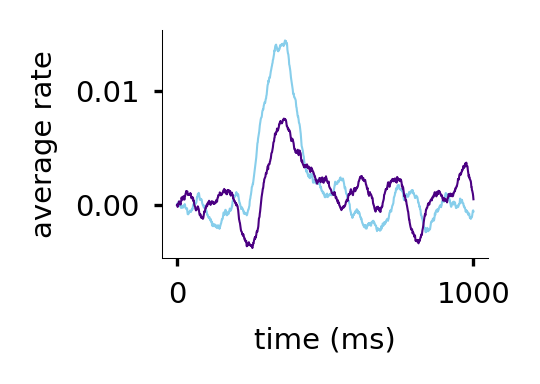

30


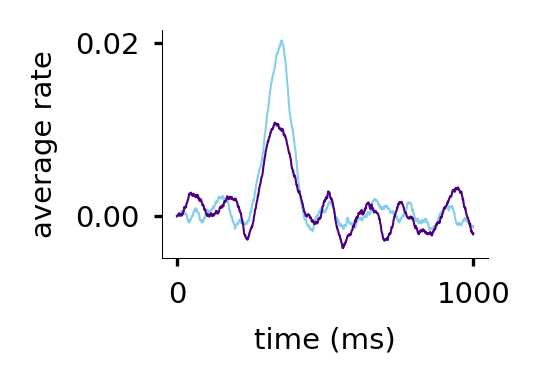

40


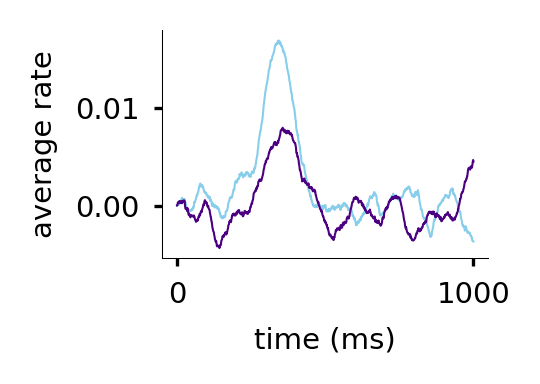

50


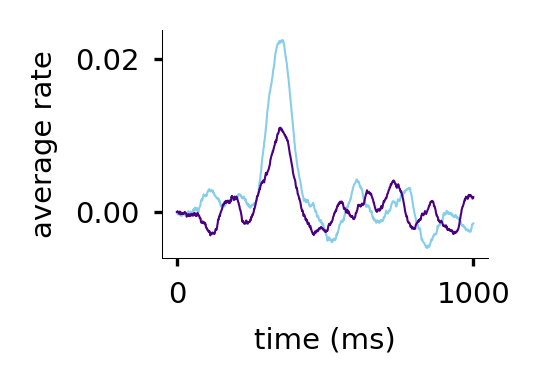

60


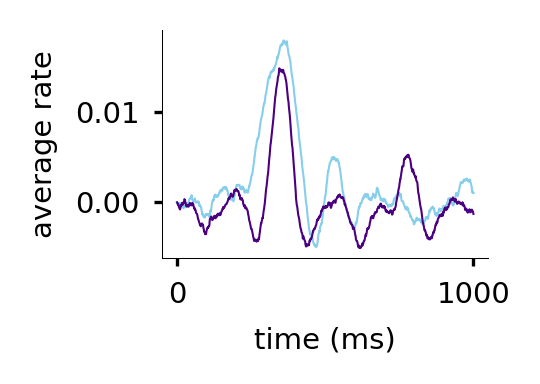

70


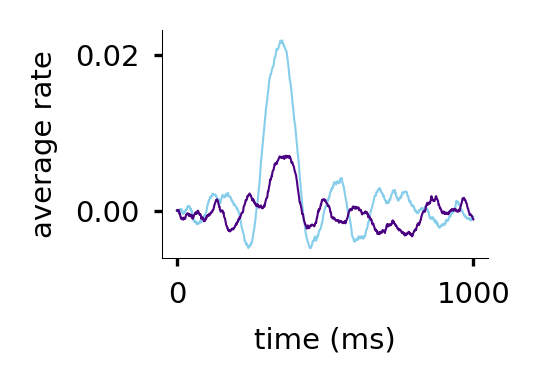

80


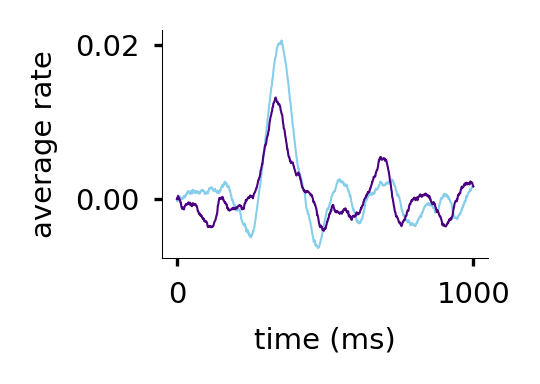

90


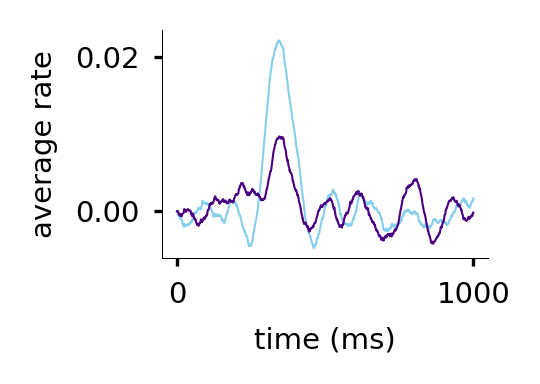

100


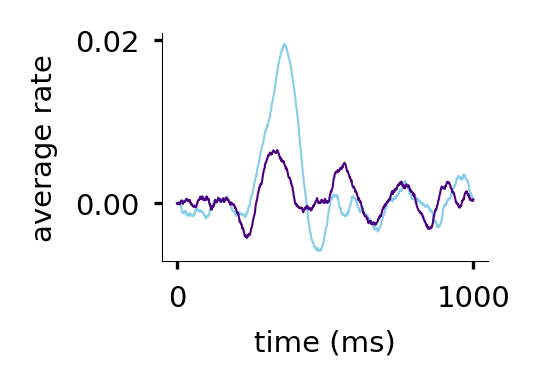

110


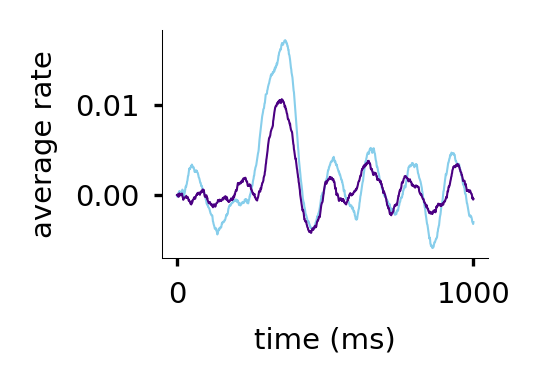

120


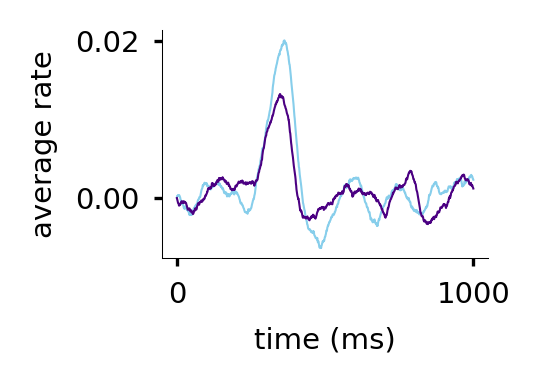

130


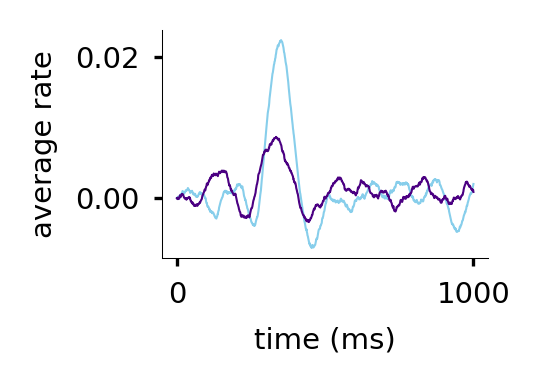

140


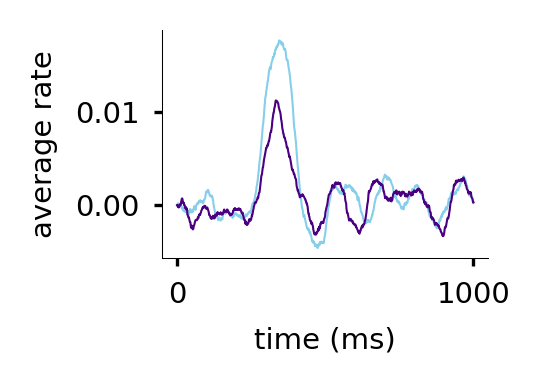

150


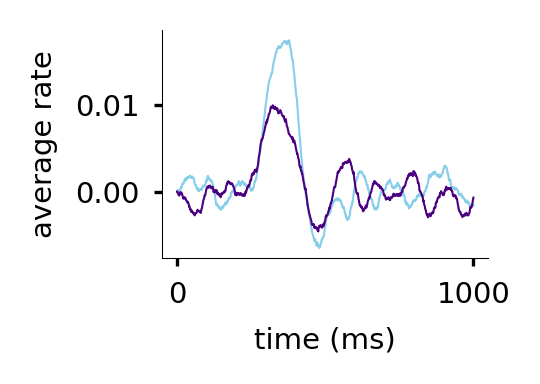

160


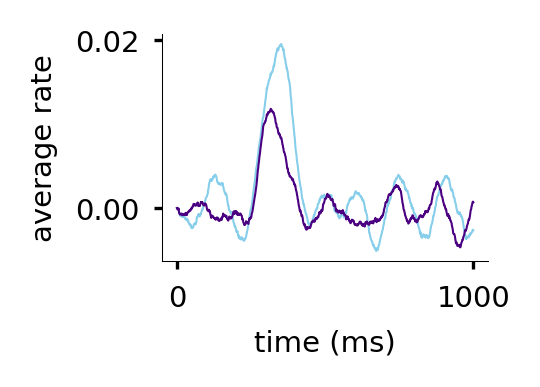

170


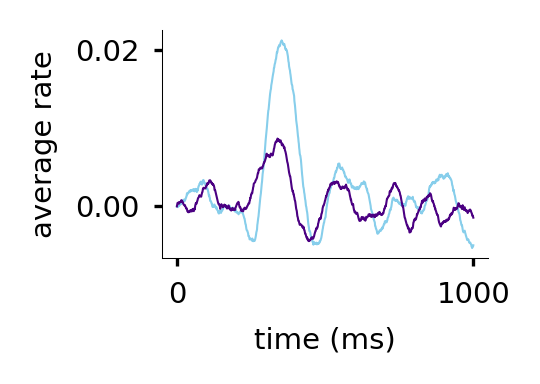

180


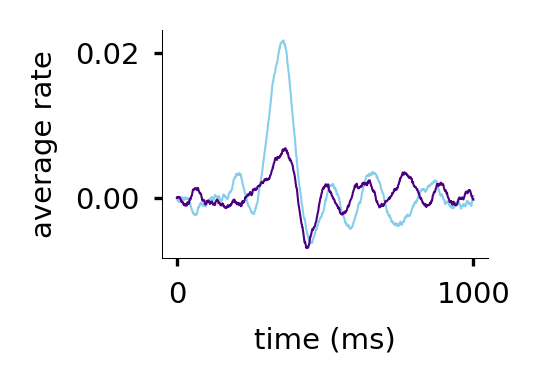

190


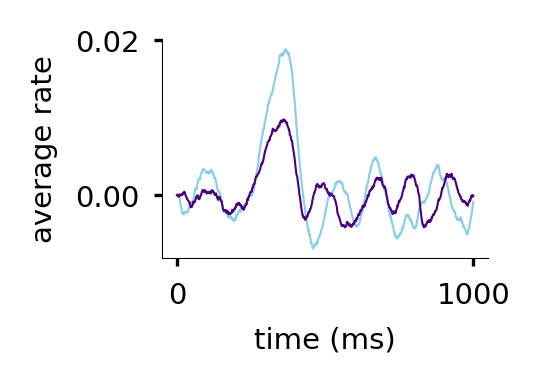

200


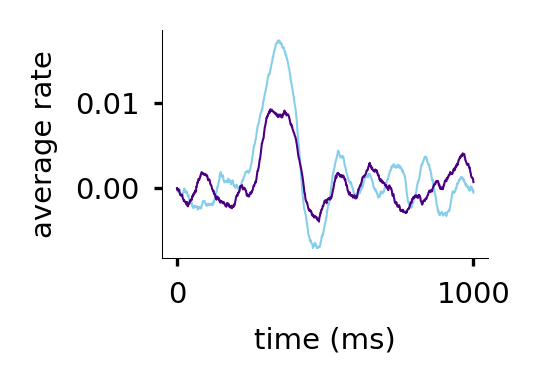

210


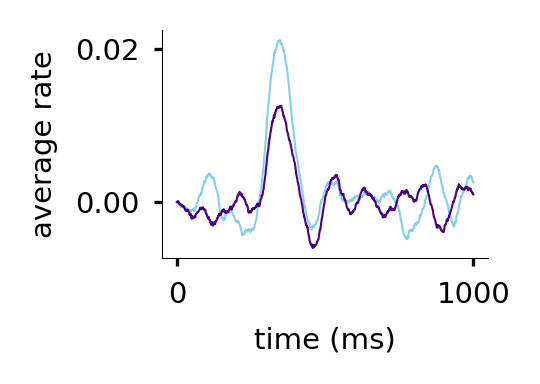

220


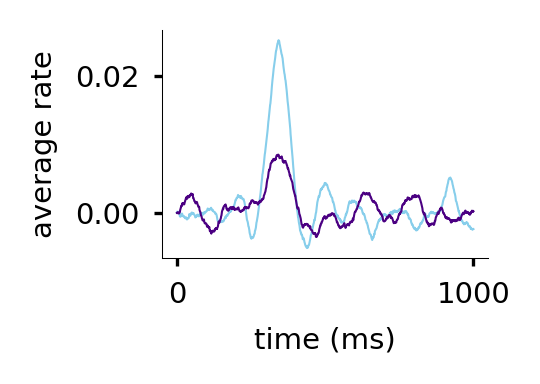

230


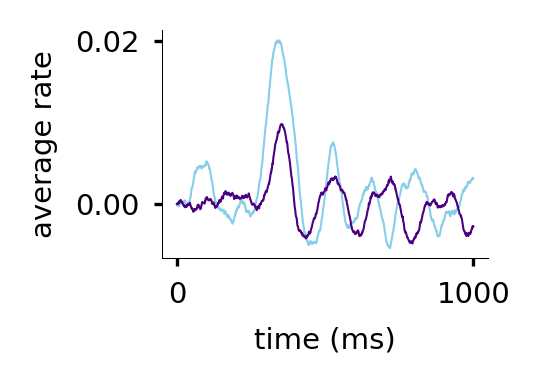

240


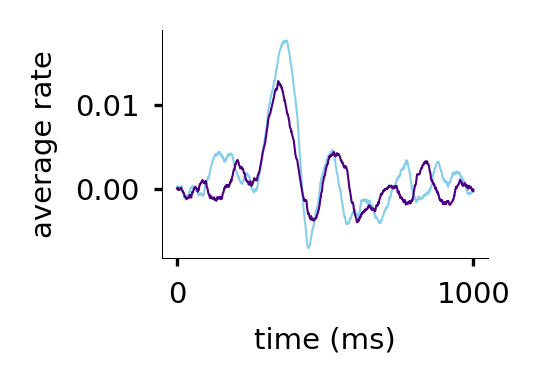

250


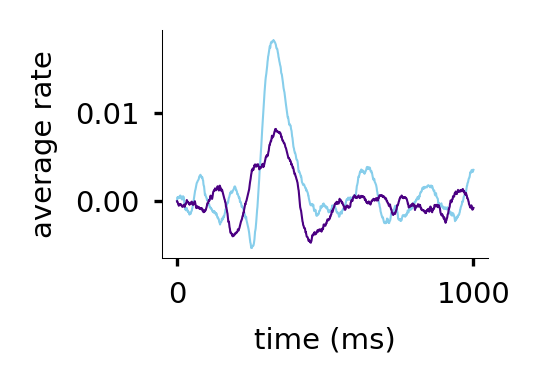

260


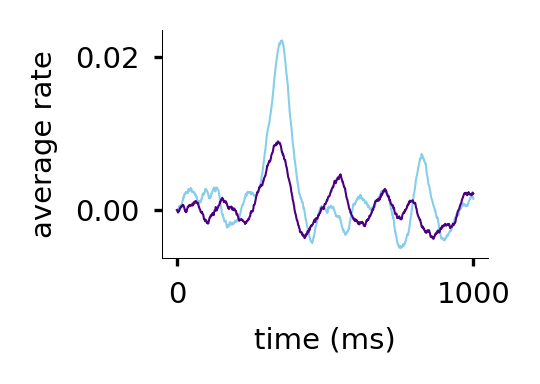

270


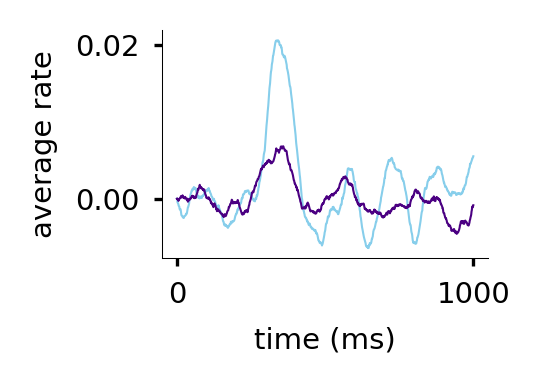

280


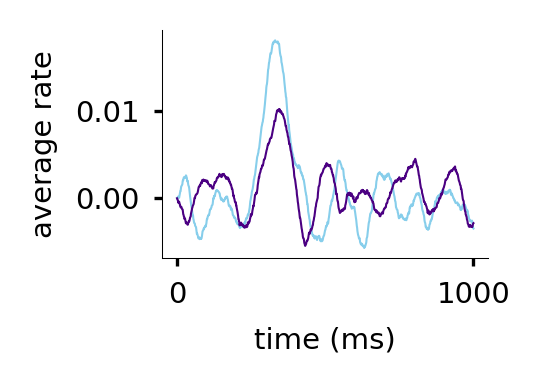

290


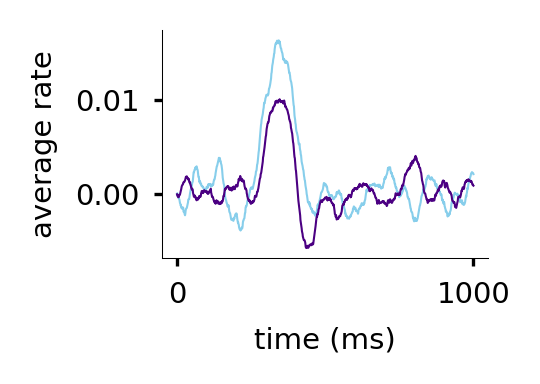

300


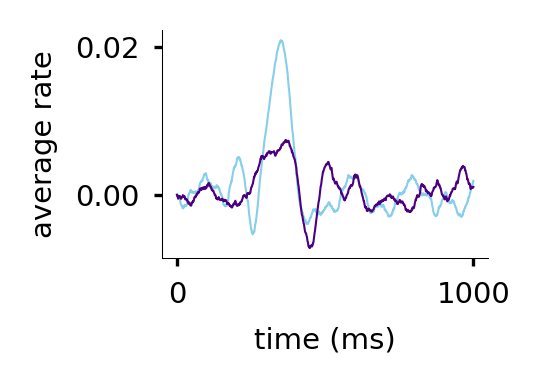

310


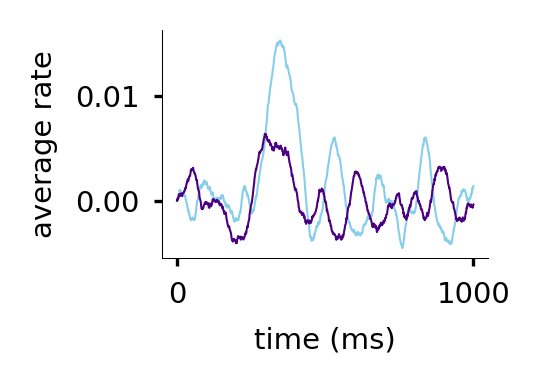

320


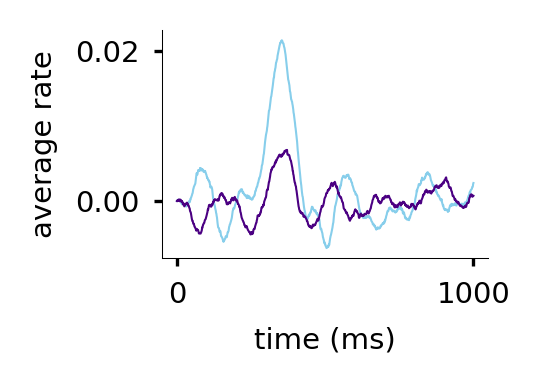

330


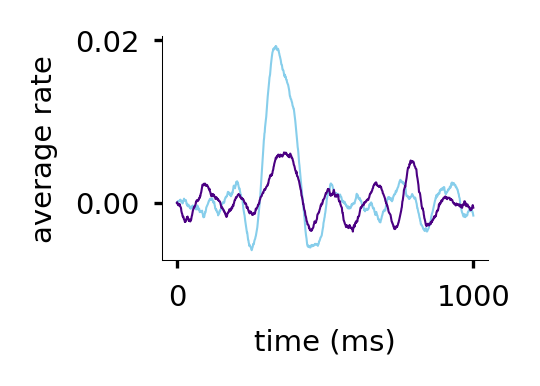

340


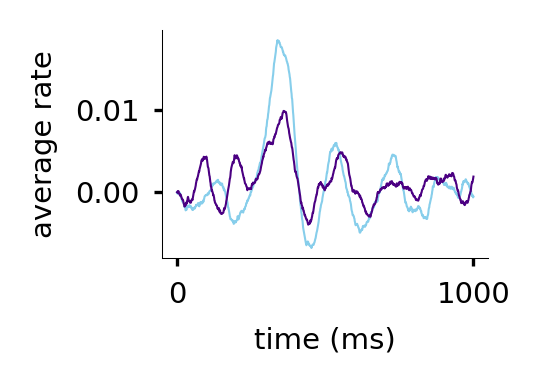

350


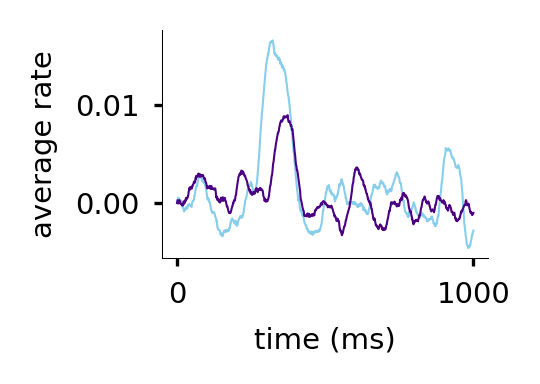

360


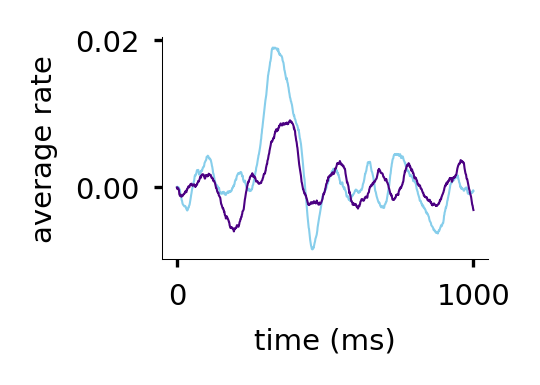

370


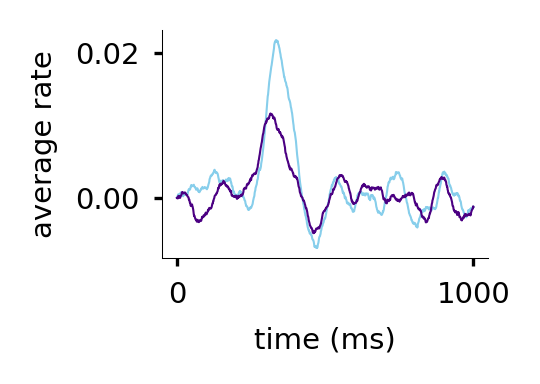

380


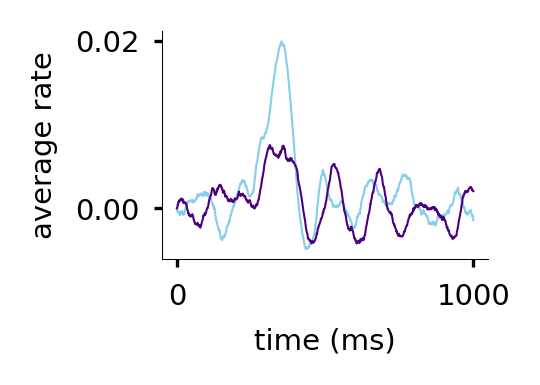

390


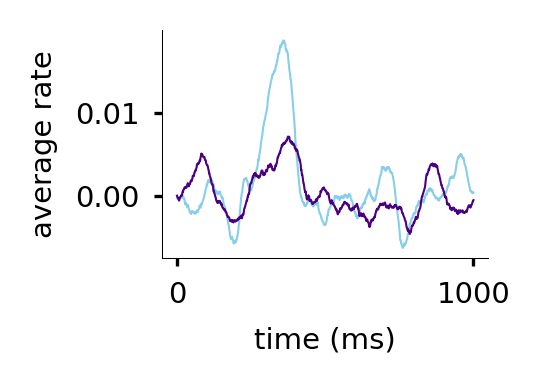

400


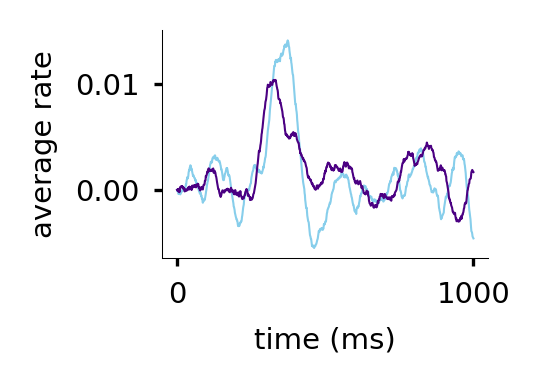

410


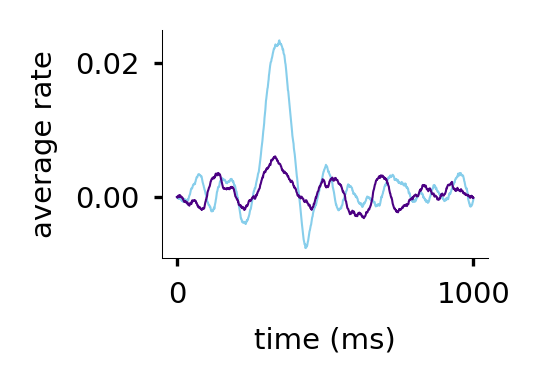

420


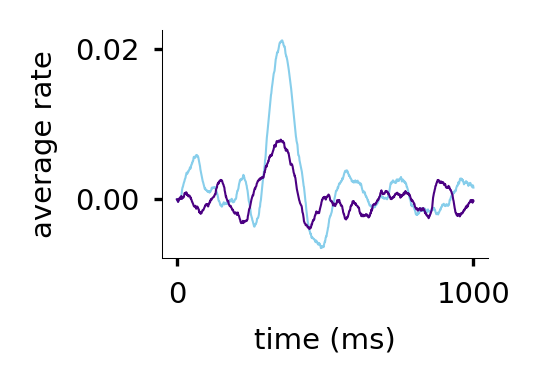

430


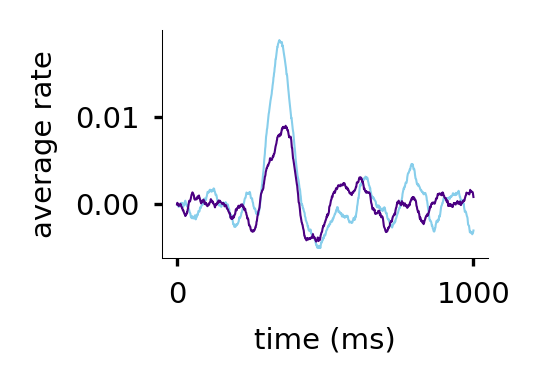

440


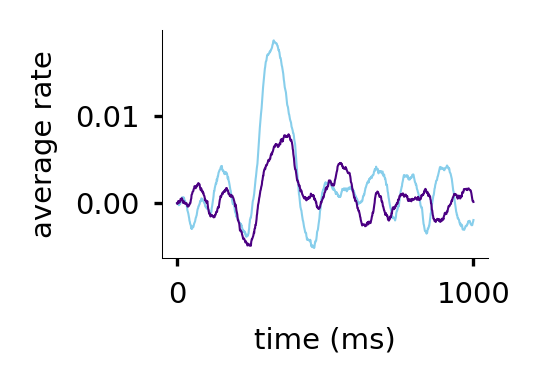

450


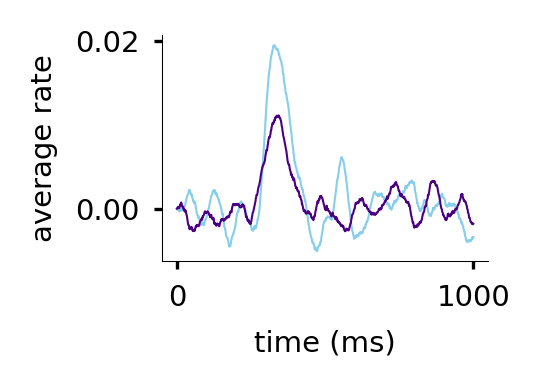

460


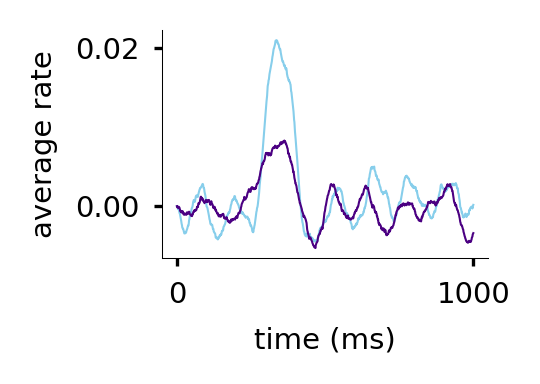

470


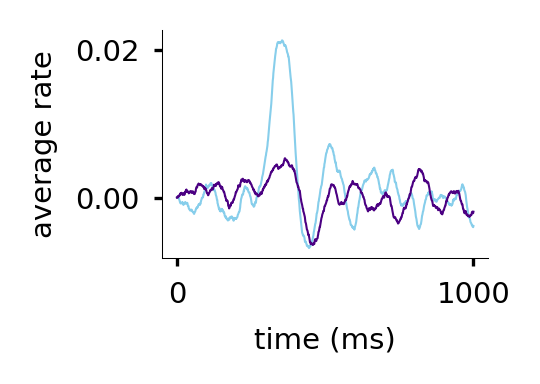

480


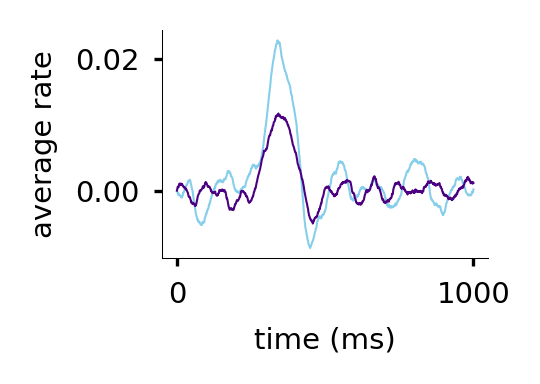

490


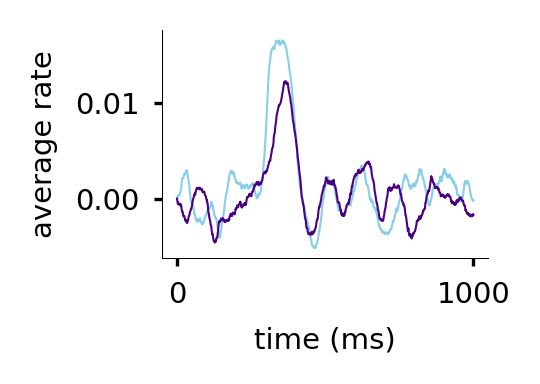

500


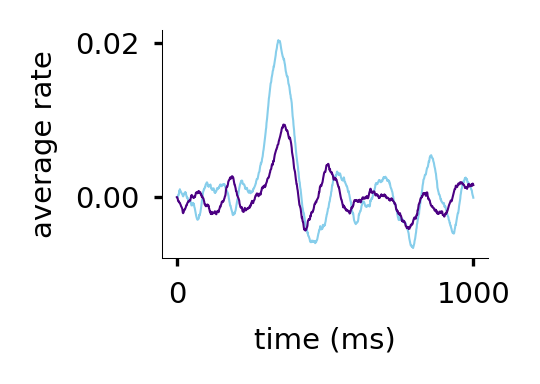

510


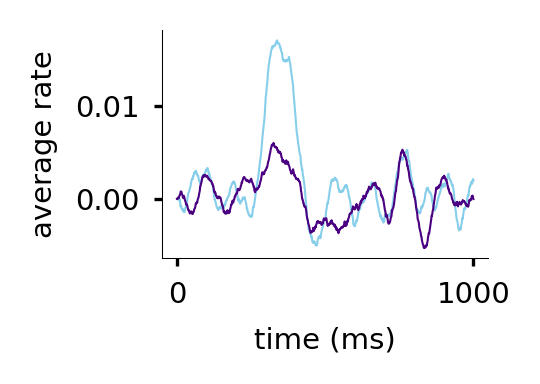

520


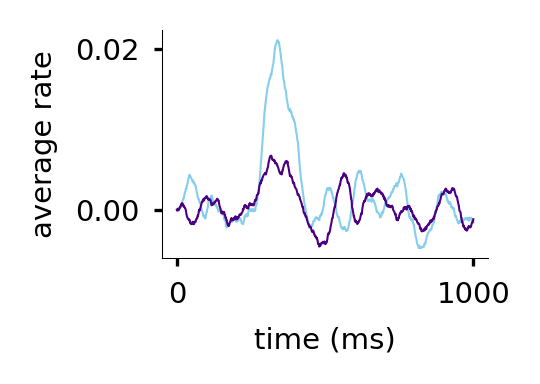

530


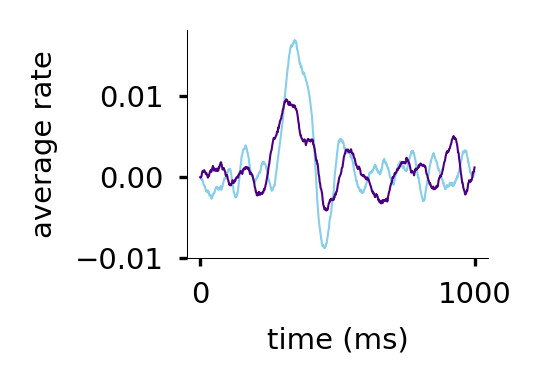

540


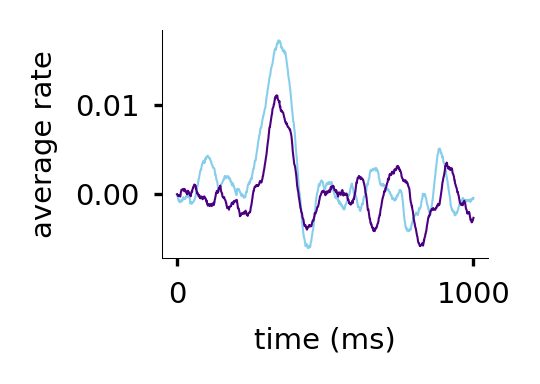

550


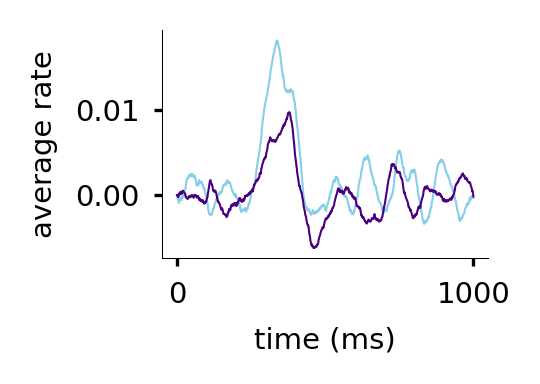

560


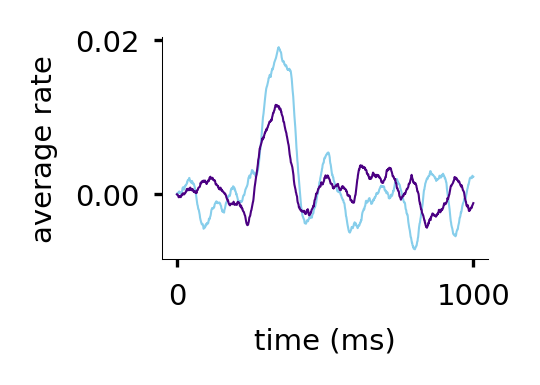

570


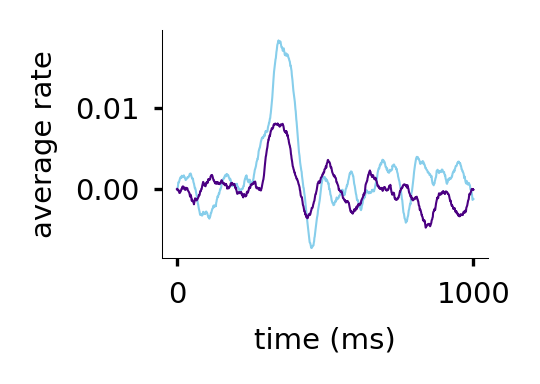

580


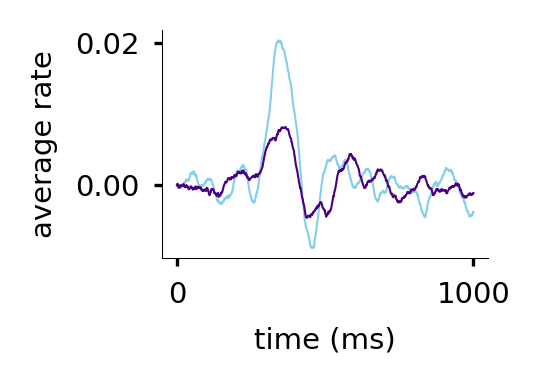

590


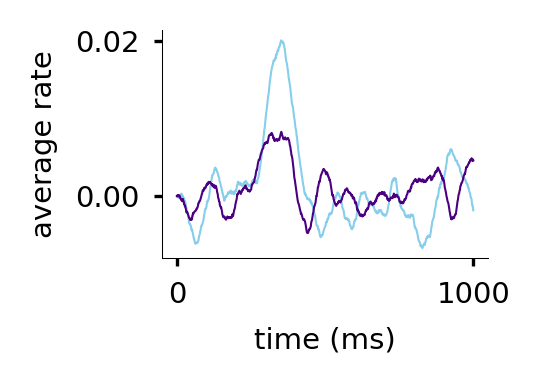

600


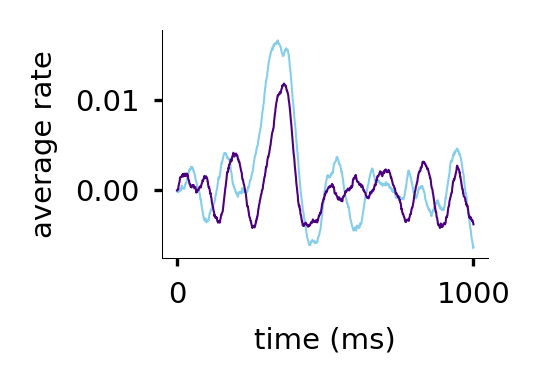

In [ ]:
for epoch_num in range(int(num_epochs/10)):
  epoch_num = (epoch_num+1)*10
  print(epoch_num)
# for epoch_num in range(20):
#   epoch_num = epoch_num+1
  checkpoint_path = f'/content/drive/My Drive/Colab Notebooks/second_training/checkpoint_epoch_{epoch_num}.pth'
  checkpoint = load_checkpoint(checkpoint_path, Net_temp)

  # # Now you can access:
  weights = checkpoint['model_state_dict']     # Get the weights
  Wrec_temp = weights['wrec']

  Net_temp = mm.RNN(num_inputs, hidden_size, output_size, Wi_init, Wo_init, Wrec_temp, alpha=alpha)
  Net_temp.to('cuda')


  #input
  sub_inps = [[4], [4,5], [0,5]]

  ## Make the test input
  test_input = np.zeros((len(sub_inps), Nt, num_inputs))
  for tr in range(len(sub_inps)):
      T0 = 200
      iT0 = int(T0/dta)
      for pat in sub_inps[tr]:
          test_input[tr,iT0:(iT0+I_length_int),pat] = 1.
          iT0 = iT0+I_length_int


  # Prep for Model
  Test_input = torch.from_numpy(test_input).type(dtype).to('cuda')

  Output_test = Net_temp.forward(Test_input)
  output_test = Output_test.cpu().detach().numpy()

  stim_mask = np.concatenate(([0]*7,[1]*13)) #np.random.choice((0,3), 30)
  wi_init_stim_masks = np.zeros((num_inputs, hidden_size))

  # for pat in range(num_inputs):
  #   wi_init_stim_masks[pat,np.where(wi_init[pat]>0)[0]] = wi_init[pat,np.where(wi_init[pat]>0)[0]]*stim_mask

  # stim_mask_top = np.concatenate(([1]*7,[0]*13)) #np.random.choice((0,3), 30)
  # wi_init_stim_masks_top = np.zeros((num_inputs, hidden_size))

  # for pat in range(num_inputs):
  #   wi_init_stim_masks_top[pat,np.where(wi_init[pat]>0)[0]] = wi_init[pat,np.where(wi_init[pat]>0)[0]]*stim_mask_top

  # Test_wi_init = torch.from_numpy(wi_init_stim_masks).type(dtype).to('cuda')

  # Output_test_p = Net_temp.forward_perturb(Test_input, Test_wi_init)
  # output_test_p = Output_test_p.cpu().detach().numpy()

  # Test_wi_init_top = torch.from_numpy(wi_init_stim_masks_top).type(dtype).to('cuda')

  # Output_test_top = Net_temp.forward_perturb(Test_input, Test_wi_init_top)
  # output_test_top = Output_test_top.cpu().detach().numpy()

  # =============================================================================
  #   Plot results
  # =============================================================================

  # Plot input stimulus structure
  iTr = 1 # sample index
  #fig = plt.figure()
  fig = plt.figure(figsize=[2, 1.5])
  ax1 = plt.gca()
  for axis in ['bottom','left']:
      ax1.spines[axis].set_linewidth(0.25)
  ax1.spines['right'].set_visible(False)
  ax1.spines['top'].set_visible(False)

  x1 = np.linspace(0, 1000, num=1000)


  Colors = ['coral', 'orange','yellow','green', 'blue', 'indigo']
  # for i in range(output_test.shape[0]):
  # plt.plot(x1[:], (output_test_p[0,:,np.where(wi_init[15]>0)[0]]).T.mean(axis=1), color=Colors[0],lw=0.5)

  Colors = ['green', 'blue','skyblue','green', 'blue', 'indigo']
  # for i in range(output_test.shape[0]):
  plt.plot(x1[:], (output_test[0,:,np.where(wi_init[5]>0)[0]]).T.mean(axis=1), color=Colors[2],lw=0.5)
  plt.plot(x1[:], (output_test[0,:,np.where(wi_init[15]>0)[0]]).T.mean(axis=1), color=Colors[5],lw=0.5)
  # plt.plot(x1[:], (output_test[2,:,np.where(wi_init[15]>0)[0]]).T.mean(axis=1), color=Colors[4],lw=0.5)

  Colors = ['green', 'blue','lightblue','lightgreen', 'blue', 'indigo']
  # for i in range(output_test.shape[0]):
  # plt.plot(x1[:], (output_test_top[0,:,np.where(wi_init[15]>0)[0]]).T.mean(axis=1), color=Colors[3],lw=0.5)

  # total = (output_test_top[0,:,np.where(wi_init[15]>0)[0]]).T.mean(axis=1) + (output_test_p[0,:,np.where(wi_init[15]>0)[0]]).T.mean(axis=1)
  # plt.plot(x1[:], total, color=Colors[5],lw=0.5)


  plt.xlabel('time (ms)', fontsize=7)
  plt.ylabel('average rate', fontsize=7)
  plt.xticks(fontsize=7)
  plt.yticks(fontsize=7)
  # plt.savefig(figs_dir/f'epoch{epoch_num}_first_training_prioronly5_15.pdf')
  plt.show()